# City of Buffalo Crime EDA & Forecasting
### Brett Neubeck
<br>

### Table of Contents

- [Summary](summary)
- [Imports](#imports)
- [Open Buffalo API Request](#api)
- [Initial Data Shape & Column Name Review](#review)
- [Check For Null Data](#null)
- [Add Date Columns](#date)
- [Exploratory Data Analysis](#eda)
- [Neighborhood Graphs](#neighGraphs)
- [Format Open Buffalo Data Dates](#formatData)
- [Geospatial Graphs](#map)
- [Geospatial Heatmaps](#map)
- [Forecast Modeling](#forecasting)
- [Conclusion](#conclusion)

### Summary
<a id='summary'></a>

This project serves as a comprehensive demonstration of crime analysis in Buffalo, utilizing an API linked to Buffalo's open data resources. In recognition of the potential data reliability issues noted on the Buffalo Open Data website prior to 2009, the decision was made to focus exclusively on data spanning from 2009 to the present day.

The primary objectives of this endeavor encompass several key aspects:

1. **Data Acquisition Through APIs**: The project commences by harnessing the power of Application Programming Interfaces (APIs) to efficiently collect and retrieve crime-related data from Buffalo's open data repository. This process ensures access to up-to-date and reliable information, essential for subsequent analysis.

2. **Exploratory Data Analysis (EDA)**: Following data acquisition, an initial exploratory analysis phase ensues. During this stage, the project aims to uncover valuable insights and trends within the crime data. This involves examining patterns by year, neighborhood, and crime type, shedding light on key factors influencing Buffalo's crime landscape.

3. **Forecasting Techniques**: Building upon the EDA findings, the project delves into advanced forecasting techniques to enhance our understanding of future crime trends. Three primary forecasting methods are employed:

   - **Simple Moving Averages**: This technique applies a straightforward moving average approach to predict future crime rates. It involves calculating the average of crime occurrences over a defined period, such as months or weeks, providing a basic yet valuable forecasting tool.

   - **Weighted Moving Averages**: In this approach, a weighted average is employed, assigning different levels of importance to data points based on their proximity to the prediction point. This method accommodates the potential significance of recent crime data in making forecasts.

   - **Exponential Moving Averages**: Recognizing the exponential decay of relevance in historical data, exponential moving averages assign greater weight to recent data points. This technique is particularly useful for capturing short-term fluctuations and trends in crime rates.

By integrating these forecasting techniques, the project aspires to provide actionable insights for stakeholders in Buffalo's law enforcement and community planning sectors. Ultimately, the goal is to enhance crime prediction accuracy, enabling proactive measures to mitigate potential issues and improve public safety. Through this multifaceted approach, the project contributes to a data-driven understanding of crime dynamics in Buffalo and empowers the city to make informed decisions for a safer future.

### Import Packages
<a id='imports'></a>

In [209]:
# import packages

import requests
import pandas as pd
import math
import datetime
import urllib.request
import json
import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from folium.plugins import HeatMap
import folium

plt.style.use('seaborn-v0_8-darkgrid')
# warnings ignore
import warnings
# set warnings to ignore
#warnings.filterwarnings('ignore')

pd.options.mode.chained_assignment = None  # default='warn'

In [210]:
# bring api key into googleColab
from google.colab import files
#import io

uploaded = files.upload()

Saving api_key.txt to api_key (2).txt


### Buffalo OpenData API
<a id='api'></a>

In [211]:
# open api key
app_token = open('api_key.txt', 'r').read()
# app_token

In [212]:
# hide api token & return BuffaloOpenData crime data
limit = 500000
app_token = open('api_key.txt', 'r').read()

uri = f"https://data.buffalony.gov/resource/d6g9-xbgu.json?$limit={limit}&$$app_token={app_token}&$where=incident_datetime>'2009-01-10T12:00:00'"

# send the HTTP GET request
r = requests.get(uri)

# check the response status code and process the data if it's successful
if r.status_code == 200:
    print('Status code:', r.status_code)
    print('Number of rows returned:', len(r.json()))
    print('Encoded URI with params:', r.url)
    new_json = r.json()
    # Process the new_json data as needed
else:
    print('Failed to fetch data. Status code:', r.status_code)


Status code: 200
Number of rows returned: 239722
Encoded URI with params: https://data.buffalony.gov/resource/d6g9-xbgu.json?$limit=500000&$$app_token=NnGV0W4ip4YEFBLvBMGAjaByD&$where=incident_datetime%3E'2009-01-10T12:00:00'


### Initial Data Shape & Column Review
<a id='review'></a>

In [213]:
data=pd.DataFrame(new_json)
print(data.shape)
data.head()

(239722, 27)


,case_number,incident_datetime,incident_type_primary,incident_description,parent_incident_type,hour_of_day,day_of_week,address_1,city,state,...,census_tract,census_block,census_block_group,neighborhood_1,police_district,council_district,tractce20,geoid20_tract,geoid20_blockgroup,geoid20_block
0,09-0100387,2009-01-10T12:19:00.000,BURGLARY,Buffalo Police are investigating this report o...,Breaking & Entering,12,Saturday,2700 Block BAILEY,Buffalo,NY,...,51,1013,1,North Park,District D,DELAWARE,005100,36029005100,360290001101,360290002001013
1,09-0100389,2009-01-10T12:21:00.000,BURGLARY,Buffalo Police are investigating this report o...,Breaking & Entering,12,Saturday,800 Block EGGERT RD,Buffalo,NY,...,41,1009,1,Kenfield,District E,UNIVERSITY,004100,36029004100,360290001101,360290002001009
2,09-0270361,2009-01-10T12:27:00.000,UUV,Buffalo Police are investigating this report o...,Theft of Vehicle,12,Saturday,1600 Block MAIN ST,Buffalo,NY,...,168.02,1017,1,Masten Park,District E,MASTEN,016802,36029016802,360290001101,360290165001017
3,09-0100435,2009-01-10T12:30:00.000,ASSAULT,Buffalo Police are investigating this report o...,Assault,12,Saturday,JEFFERSON AV & E FERRY ST,Buffalo,NY,...,168.02,2000,2,Masten Park,District E,MASTEN,016802,36029016802,360290001102,360290046012000
4,09-0100421,2009-01-10T12:30:00.000,BURGLARY,Buffalo Police are investigating this report o...,Breaking & Entering,12,Saturday,100 Block URBAN ST,Buffalo,NY,...,35.02,2000,2,MLK Park,District C,MASTEN,003502,36029003502,360290001102,360290046012000


In [214]:
# check data types and swicth to int, floats and strings
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239722 entries, 0 to 239721
Data columns (total 27 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   case_number              239722 non-null  object
 1   incident_datetime        239722 non-null  object
 2   incident_type_primary    239722 non-null  object
 3   incident_description     239722 non-null  object
 4   parent_incident_type     239722 non-null  object
 5   hour_of_day              239722 non-null  object
 6   day_of_week              239722 non-null  object
 7   address_1                239705 non-null  object
 8   city                     239722 non-null  object
 9   state                    239722 non-null  object
 10  location                 235055 non-null  object
 11  latitude                 235055 non-null  object
 12  longitude                235055 non-null  object
 13  created_at               239722 non-null  object
 14  census_tract_2010   

### Check For Null Data
<a id='null'></a>

In [215]:
# check for null
data.isnull().sum()

case_number                   0
incident_datetime             0
incident_type_primary         0
incident_description          0
parent_incident_type          0
hour_of_day                   0
day_of_week                   0
address_1                    17
city                          0
state                         0
location                   4667
latitude                   4667
longitude                  4667
created_at                    0
census_tract_2010          2009
census_block_group_2010    2009
census_block_2010          2009
census_tract               2009
census_block               2009
census_block_group         2009
neighborhood_1             2009
police_district            2009
council_district           2009
tractce20                  1872
geoid20_tract              1872
geoid20_blockgroup         1872
geoid20_block              1872
dtype: int64

In [216]:
# chatgpt code for function displaying null & non-null column ratios

def null_nonnull_ratios(dataframe):
    """
    Calculate the ratios of null and non-null data in a pandas DataFrame.

    Parameters:
    dataframe (pd.DataFrame): The DataFrame for which you want to calculate null and non-null ratios.

    Returns:
    pd.DataFrame: A DataFrame containing columns for null and non-null ratios for each column.
    """
    total_rows = len(dataframe)
    null_counts = dataframe.isnull().sum()
    nonnull_counts = total_rows - null_counts
    null_ratios = null_counts / total_rows
    nonnull_ratios = nonnull_counts / total_rows
    result_df = pd.DataFrame({'null': null_ratios, 'non-null': nonnull_ratios})
    return result_df

ratios = null_nonnull_ratios(data)
print(ratios)


                             null  non-null
case_number              0.000000  1.000000
incident_datetime        0.000000  1.000000
incident_type_primary    0.000000  1.000000
incident_description     0.000000  1.000000
parent_incident_type     0.000000  1.000000
hour_of_day              0.000000  1.000000
day_of_week              0.000000  1.000000
address_1                0.000071  0.999929
city                     0.000000  1.000000
state                    0.000000  1.000000
location                 0.019468  0.980532
latitude                 0.019468  0.980532
longitude                0.019468  0.980532
created_at               0.000000  1.000000
census_tract_2010        0.008381  0.991619
census_block_group_2010  0.008381  0.991619
census_block_2010        0.008381  0.991619
census_tract             0.008381  0.991619
census_block             0.008381  0.991619
census_block_group       0.008381  0.991619
neighborhood_1           0.008381  0.991619
police_district          0.00838

### Add Date Columns
<a id='date'></a>

In [217]:
# make new date columns to groupby for EDA

data.index = pd.DatetimeIndex(data['incident_datetime'])

data['Year'] = data.index.year
data['Month'] = data.index.month
data['dayOfWeek'] = data.index.dayofweek
data['dayOfMonth'] = data.index.day
data['dayOfYear'] = data.index.dayofyear
data['weekOfMonth'] = data.dayOfMonth.apply(lambda d: (d - 1) // 7 + 1)

dayOfYear = list(data.index.dayofyear)

weekOfYear = [math.ceil(i/7) for i in dayOfYear]
data['weekOfYear'] = weekOfYear

In [218]:
# code for color slection on graphs / comment out later

import math

from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


def plot_colortable(colors, *, ncols=4, sort_colors=True):

    cell_width = 212
    cell_height = 22
    swatch_width = 48
    margin = 12

    # Sort colors by hue, saturation, value and name.
    if sort_colors is True:
        names = sorted(
            colors, key=lambda c: tuple(mcolors.rgb_to_hsv(mcolors.to_rgb(c))))
    else:
        names = list(colors)

    n = len(names)
    nrows = math.ceil(n / ncols)

    width = cell_width * 4 + 2 * margin
    height = cell_height * nrows + 2 * margin
    dpi = 72

    fig, ax = plt.subplots(figsize=(width / dpi, height / dpi), dpi=dpi)
    fig.subplots_adjust(margin/width, margin/height,
                        (width-margin)/width, (height-margin)/height)
    ax.set_xlim(0, cell_width * 4)
    ax.set_ylim(cell_height * (nrows-0.5), -cell_height/2.)
    ax.yaxis.set_visible(False)
    ax.xaxis.set_visible(False)
    ax.set_axis_off()

    for i, name in enumerate(names):
        row = i % nrows
        col = i // nrows
        y = row * cell_height

        swatch_start_x = cell_width * col
        text_pos_x = cell_width * col + swatch_width + 7

        ax.text(text_pos_x, y, name, fontsize=14,
                horizontalalignment='left',
                verticalalignment='center')

        ax.add_patch(
            Rectangle(xy=(swatch_start_x, y-9), width=swatch_width,
                      height=18, facecolor=colors[name], edgecolor='0.7')
        )

    return fig

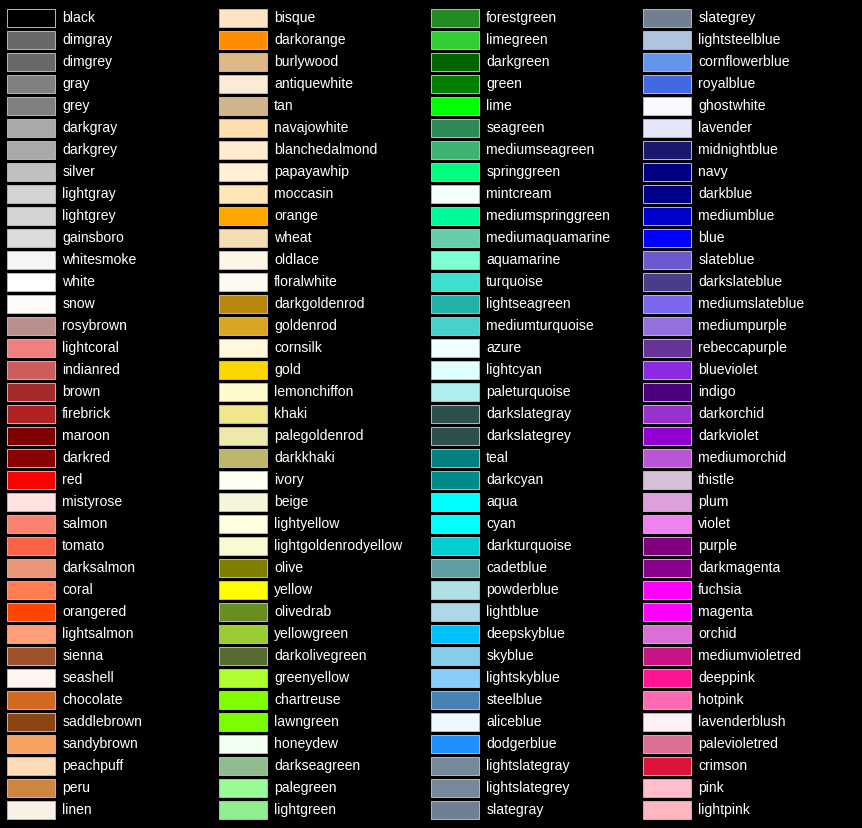

In [219]:
# available colors for graphs / comment out later
plt.style.use('dark_background')  # set the background to black
plot_colortable(mcolors.CSS4_COLORS)
plt.show()

### Exploratory Data Analysis
<a id='eda'></a>

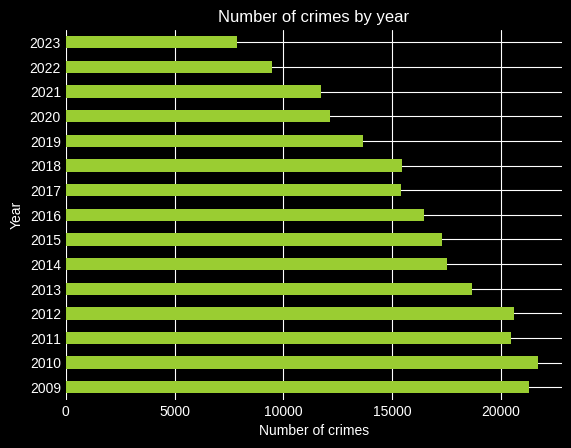

In [220]:
# yearly analysis on crime count

# plt.style.use('dark_background')  # set the background to black
# once plt.style is set there is no need to include teh code setting in future plots
ax = data.groupby([data.Year]).size().plot(legend=False, color='yellowgreen', kind='barh')

plt.ylabel('Year', color='white')
plt.xlabel('Number of crimes', color='white')
plt.title('Number of crimes by year', color='white')

plt.tick_params(axis='both', colors='white')  # Set tick color
ax.spines['bottom'].set_color('white')  # Set x-axis color
ax.spines['left'].set_color('white')  # Set y-axis color

plt.show()

The graph presented above illustrates a noteworthy annual decline in the total number of crimes since the year 2009. <br><br>

Furthermore, as depicted in the chart below, the year 2022 accounts for a relatively modest 3.95% of the total crimes recorded in the dataset spanning from 2009 to the present day.

In [221]:
# above graph data in chart form
print(f'Percentage of total crimes in dataset(2009-2023) per year:\n\n{data.Year.value_counts(normalize=True)}')

Percentage of total crimes in dataset(2009-2023) per year:

2010    0.090559
2009    0.088761
2012    0.085991
2011    0.085399
2013    0.077807
2014    0.073097
2015    0.072033
2016    0.068629
2018    0.064516
2017    0.064262
2019    0.057020
2020    0.050571
2021    0.049011
2022    0.039533
2023    0.032809
Name: Year, dtype: float64


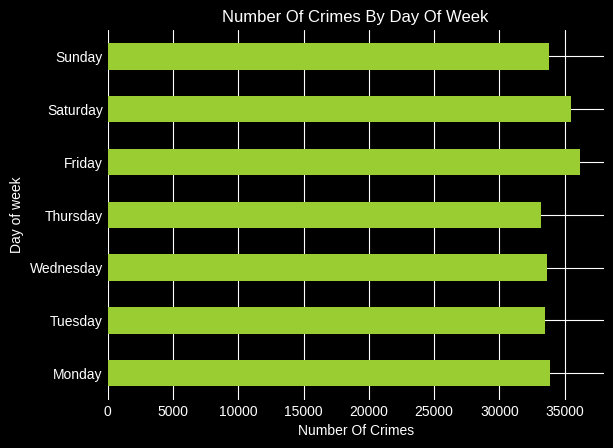

In [222]:
#crimes by day of week
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

ax = data.groupby([data.dayOfWeek]).size().plot(legend=False, color='yellowgreen', kind='barh')
#ax = data.groupby([data.Year]).size().plot(legend=False, color='yellowgreen', kind='barh')

plt.ylabel('Day of week', color='white')
plt.yticks(np.arange(7), days)
plt.xlabel('Number Of Crimes', color='white')
plt.title('Number Of Crimes By Day Of Week', color='white')

plt.tick_params(axis='both', colors='white')  # Set tick color
ax.spines['bottom'].set_color('white')  # Set x-axis color
ax.spines['left'].set_color('white')  # Set y-axis color

plt.show()

Friday appears to exhibit a slightly higher incidence of crimes when compared to other days, although this difference is not markedly significant.

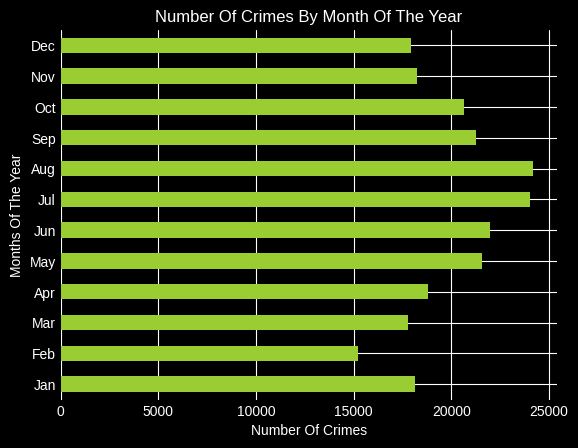

In [223]:
# crimes by month
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
data.groupby([data.Month]).size().plot(kind='barh', color='yellowgreen')
plt.ylabel('Months Of The Year')
plt.yticks(np.arange(12), months)
plt.xlabel('Number Of Crimes')
plt.title('Number Of Crimes By Month Of The Year')
plt.show()

In [224]:
# define a dictionary to map numeric month values to month names
month_names = {
    1: 'January',
    2: 'February',
    3: 'March',
    4: 'April',
    5: 'May',
    6: 'June',
    7: 'July',
    8: 'August',
    9: 'September',
    10: 'October',
    11: 'November',
    12: 'December'
}

# map the numeric month values to month names
data['MonthNames'] = data['Month'].map(month_names)

# calculate the counts of each month and normalize the results
month_counts = data['MonthNames'].value_counts(normalize=True)

print(f'Percentage of Crime Per Month:\n\n{month_counts}')


Percentage of Crime Per Month:

August       0.100879
July         0.100212
June         0.091752
May          0.089896
September    0.088649
October      0.086217
April        0.078445
November     0.076042
January      0.075567
December     0.074728
March        0.074190
February     0.063423
Name: MonthNames, dtype: float64


The graphical representations above provide a clear depiction of February consistently registering the lowest number of crimes per month.<br><br>

Moreover, the chart underscores a pronounced disparity in crime rates between the sweltering summer months and the frigid winter months.

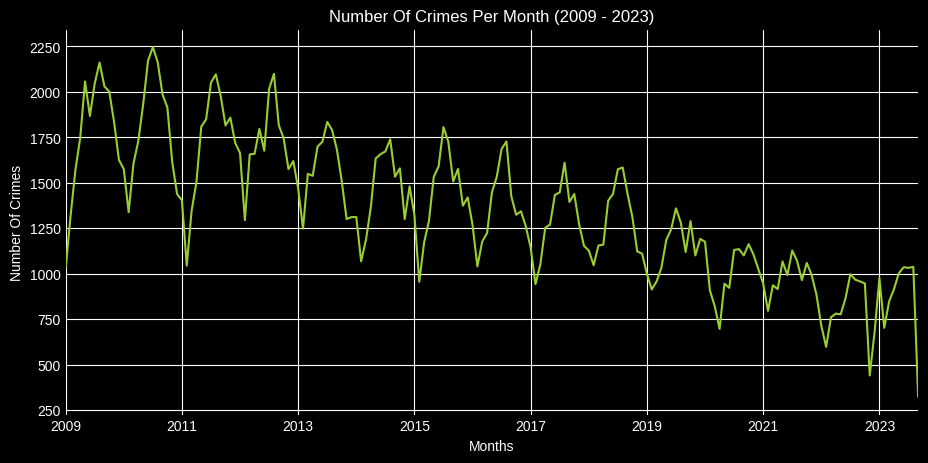

In [225]:
plt.figure(figsize=(11,5))
data.resample('M').size().plot(legend=False, color='yellowgreen')
plt.title('Number Of Crimes Per Month (2009 - 2023)')
plt.xlabel('Months')
plt.ylabel('Number Of Crimes')
plt.show()

The chart presented above vividly illustrates a declining trend in annual crime rates.<br><br>

Furthermore, it unveils a distinctive zigzag pattern, with crime receding during the colder seasons and resurging during the hotter months.

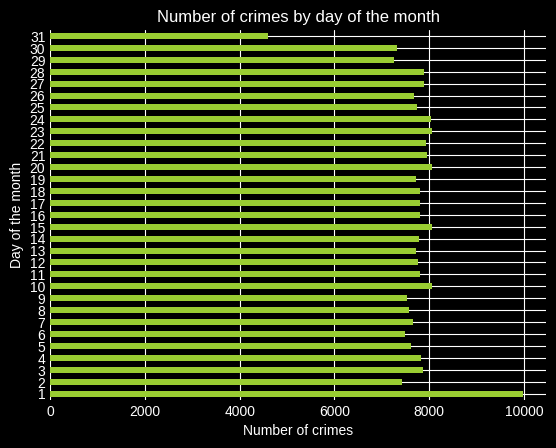

In [226]:
data.groupby([data.dayOfMonth]).size().plot(kind='barh',legend=False, color='yellowgreen')
plt.ylabel('Day of the month')
plt.xlabel('Number of crimes')
plt.title('Number of crimes by day of the month')
plt.show()

In [227]:
print(f'Percentage Of Crime Per Day Of Month:\n\n{data.dayOfMonth.value_counts(normalize=True)}')

Percentage Of Crime Per Day Of Month:

1     0.041590
20    0.033643
23    0.033635
15    0.033626
10    0.033606
24    0.033547
21    0.033159
22    0.033080
28    0.032884
27    0.032880
3     0.032792
4     0.032667
18    0.032596
16    0.032529
11    0.032529
17    0.032521
14    0.032475
12    0.032408
25    0.032287
13    0.032246
19    0.032237
26    0.032033
7     0.031916
5     0.031758
8     0.031566
9     0.031411
6     0.031257
2     0.031015
30    0.030577
29    0.030310
31    0.019218
Name: dayOfMonth, dtype: float64


The data suggests that the first day of each month consistently records the highest incidence of criminal activities.

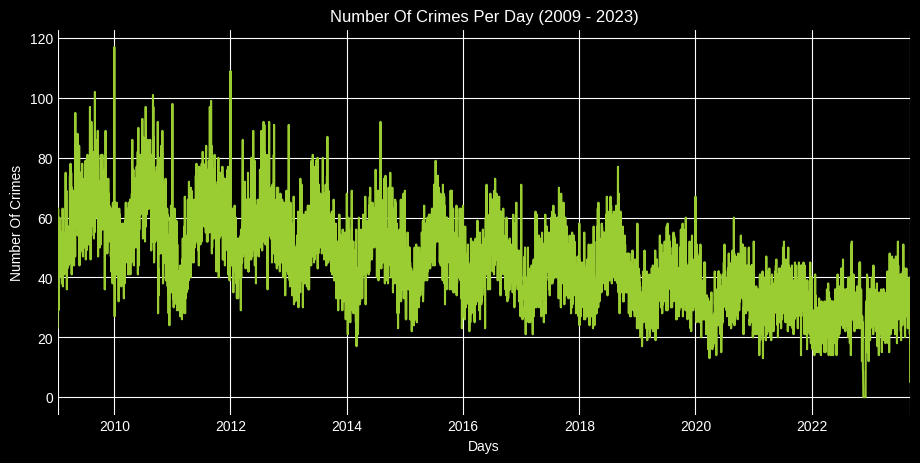

In [228]:
# crimes plotted per day
plt.figure(figsize=(11,5))
data.resample('D').size().plot(legend=False, color='yellowgreen')
plt.title('Number Of Crimes Per Day (2009 - 2023)')
plt.xlabel('Days')
plt.ylabel('Number Of Crimes')
plt.show()

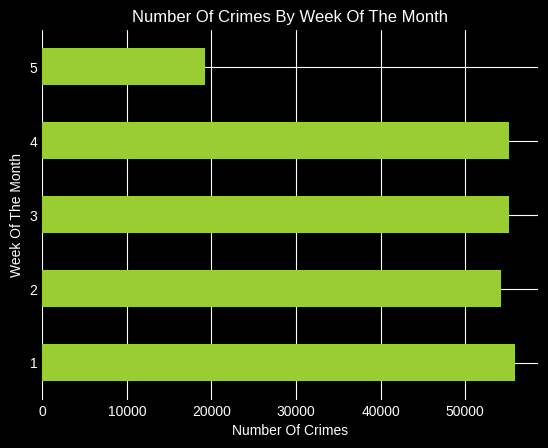

In [229]:
# crimes plotted by week of month
data.groupby([data.weekOfMonth]).size().plot(kind='barh',  color='yellowgreen')
plt.ylabel('Week Of The Month')
plt.xlabel('Number Of Crimes')
plt.title('Number Of Crimes By Week Of The Month')
plt.show()

In [230]:
print(f'Percentage Of Crime Per Week Of Month:\n\n{data.weekOfMonth.value_counts(normalize=True)}')

#data.weekOfMonth.value_counts(normalize=True)

Percentage Of Crime Per Week Of Month:

1    0.232995
4    0.230346
3    0.230313
2    0.226241
5    0.080105
Name: weekOfMonth, dtype: float64


Based on the insights gleaned from the preceding graph and chart, it becomes evident that the specific week within a month may not significantly impact crime rates. Notably, the observation that the fifth week records fewer incidents can be attributed to its shorter duration.

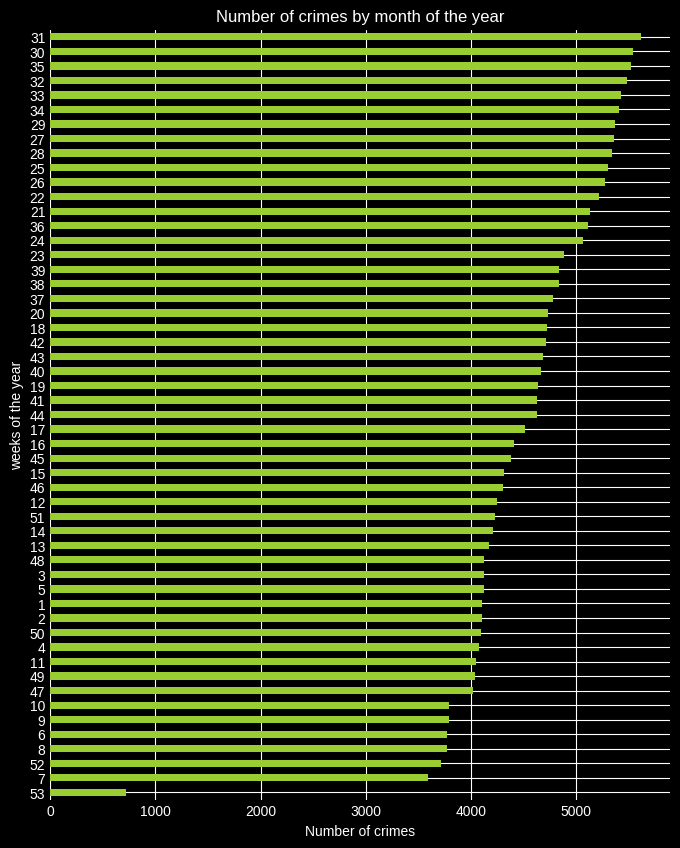

In [231]:
# week of year
plt.figure(figsize=(8,10))
data.groupby([data.weekOfYear]).size().sort_values().plot(kind='barh', color='yellowgreen')
plt.ylabel('weeks of the year')
plt.xlabel('Number of crimes')
plt.title('Number of crimes by month of the year')
plt.show()

The graph above serves as an additional perspective, reaffirming the correlation between warmer months and their respective weeks, which consistently exhibit higher crime rates when contrasted with the colder months.

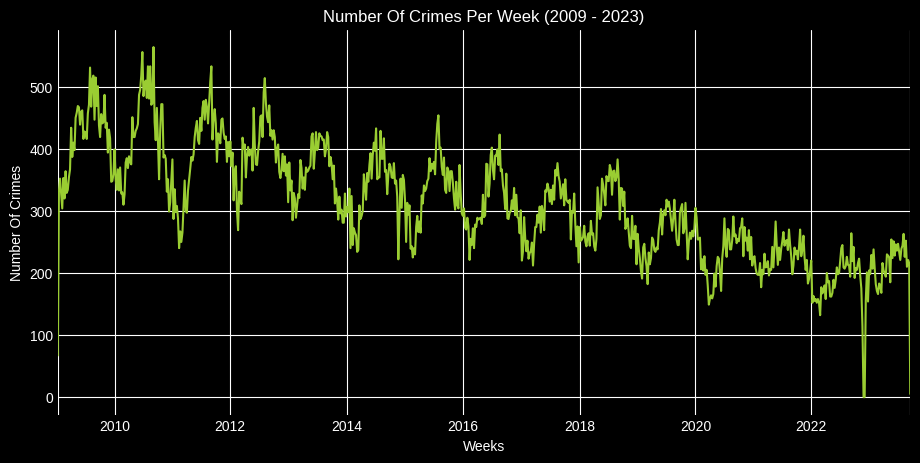

In [232]:
# number of crimes per week
plt.figure(figsize=(11,5))
data.resample('W').size().plot(legend=False,color='yellowgreen')
plt.title('Number Of Crimes Per Week (2009 - 2023)')
plt.xlabel('Weeks')
plt.ylabel('Number Of Crimes')
plt.show()

The graph displayed above offers yet another illustrative trendline, dissected on a weekly basis, spanning from 2009 to the present day.<br><br>

Now, let's delve into the substantial decline at the outset of 2023 and investigate whether it can indeed be attributed to the blizzard event.

In [233]:
# grab the dec 2022 and jan 2023 data only
blizzard2022 = data[(data['Year'] == 2022) & (data['Month'] == 12)]
blizzard2023 = data[(data['Year'] == 2023) & (data['Month'] == 1)]

In [234]:
# concatenate the two DataFrames
blizzard_combined = pd.concat([blizzard2022, blizzard2023], ignore_index=True)
#blizzard_combined

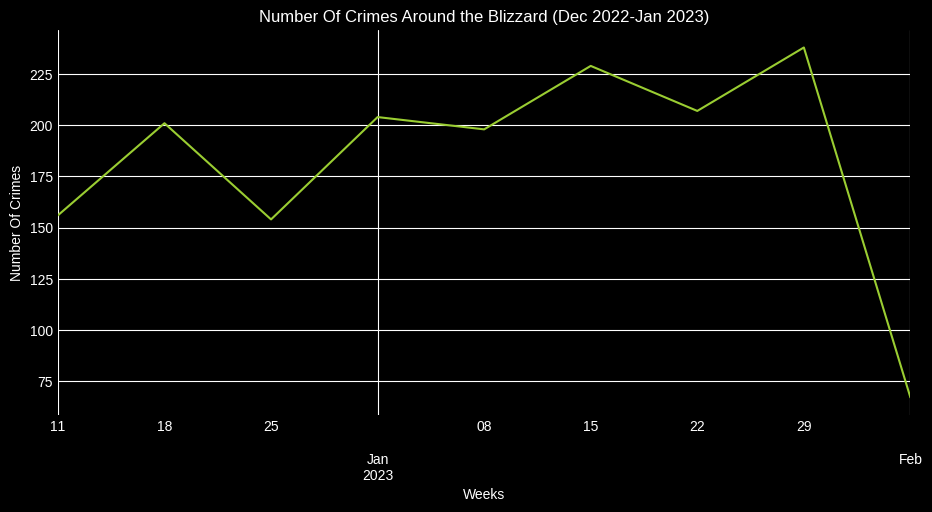

In [235]:
# convert the 'incident_datetime' column to a datetime type if it's not already
blizzard_combined['incident_datetime'] = pd.to_datetime(blizzard_combined['incident_datetime'])

# set the 'incident_datetime' column as the index
blizzard_combined.set_index('incident_datetime', inplace=True)

# plot the number of crimes using resample
plt.figure(figsize=(11, 5))
blizzard_combined.resample('W').size().plot(legend=False, color='yellowgreen')
plt.title('Number Of Crimes Around the Blizzard (Dec 2022-Jan 2023)')
plt.xlabel('Weeks')
plt.ylabel('Number Of Crimes')
plt.show()


My initial hypothesis has been disproven; the decrease in crime can be attributed to February's weather conditions rather than the blizzard event.

### Neighborhood Graphs
<a id='neighGraphs'></a>

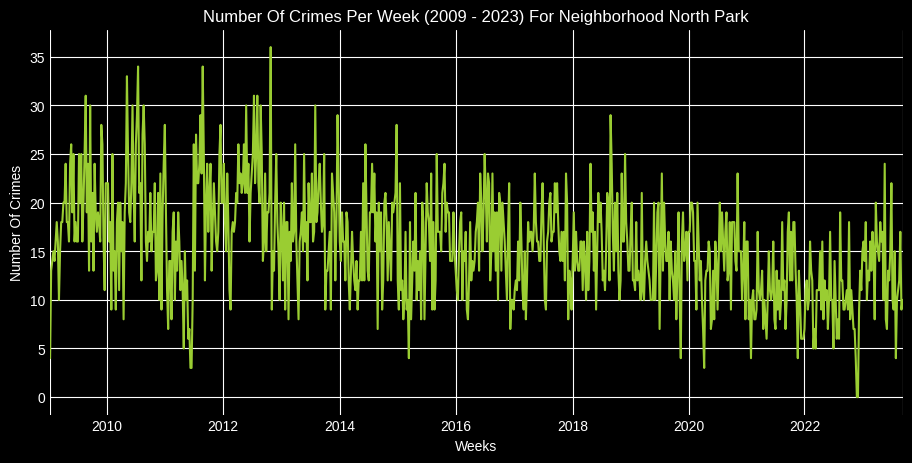

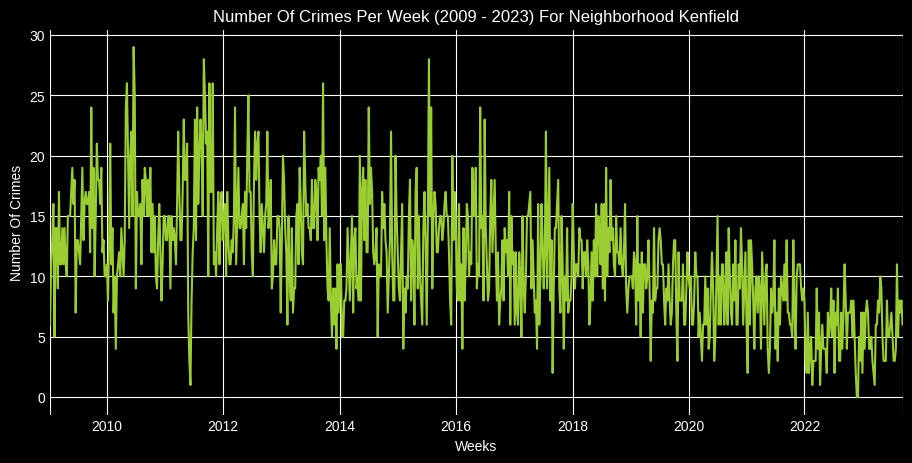

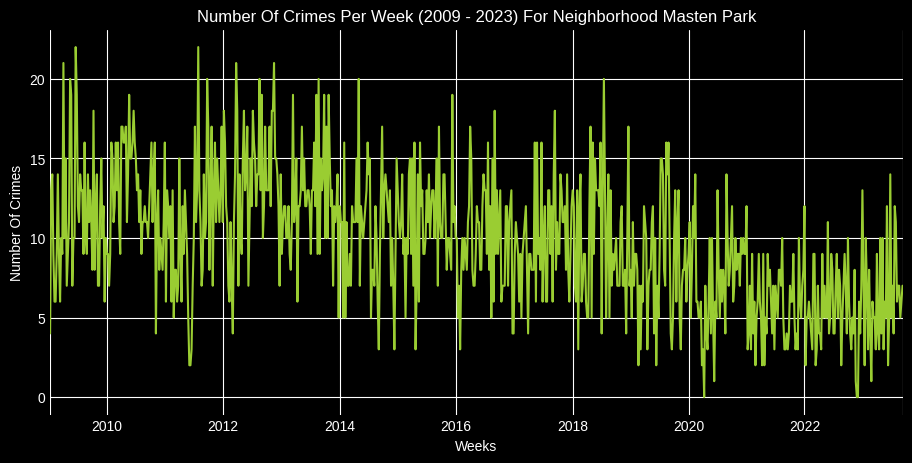

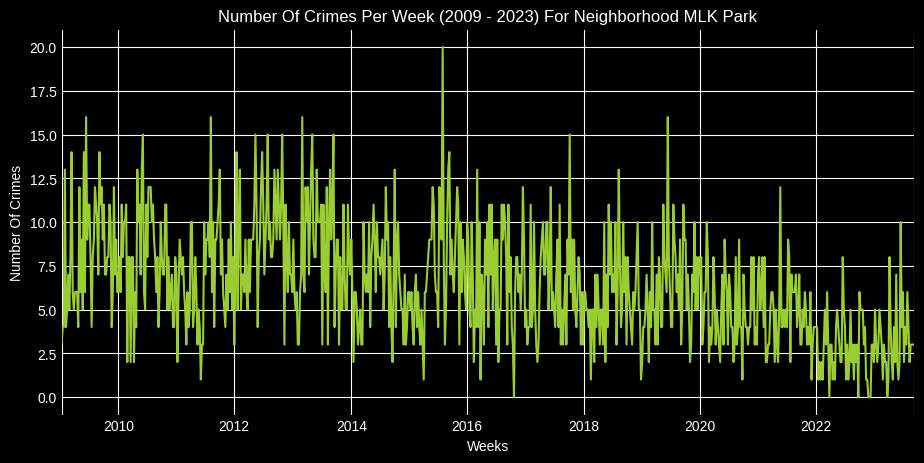

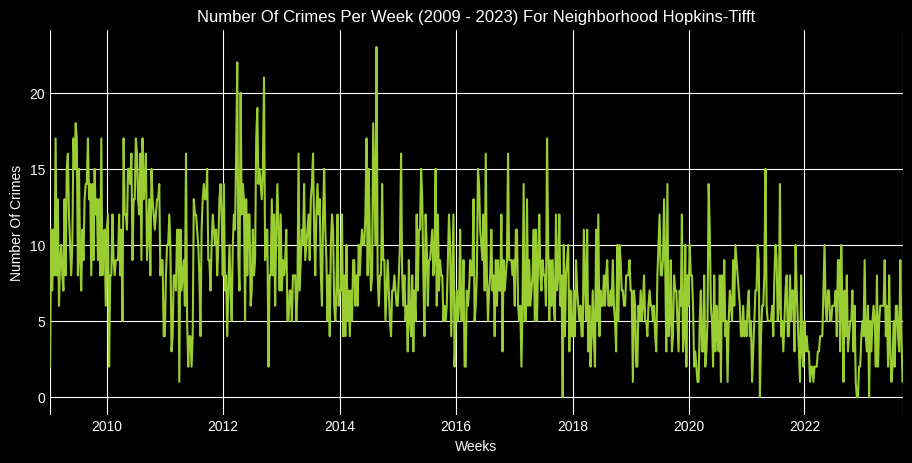

...

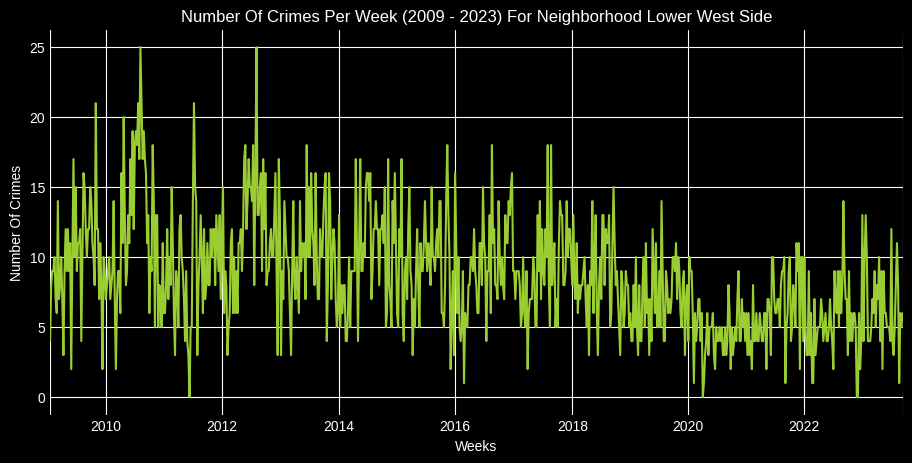

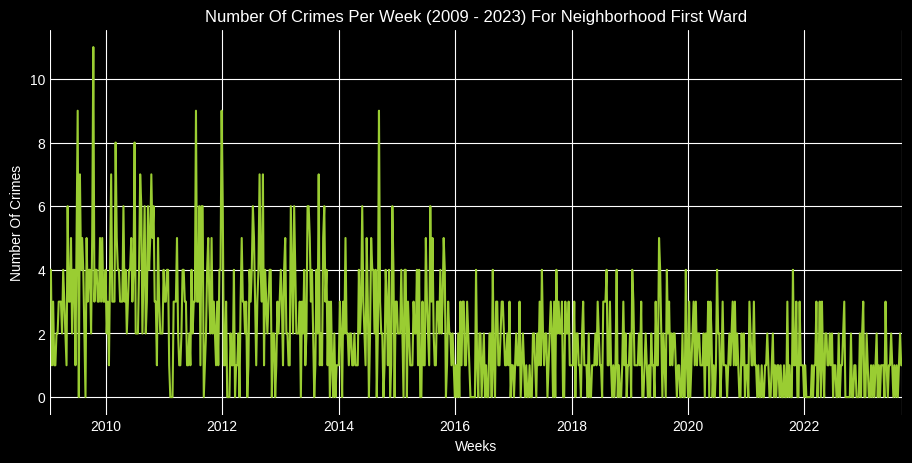

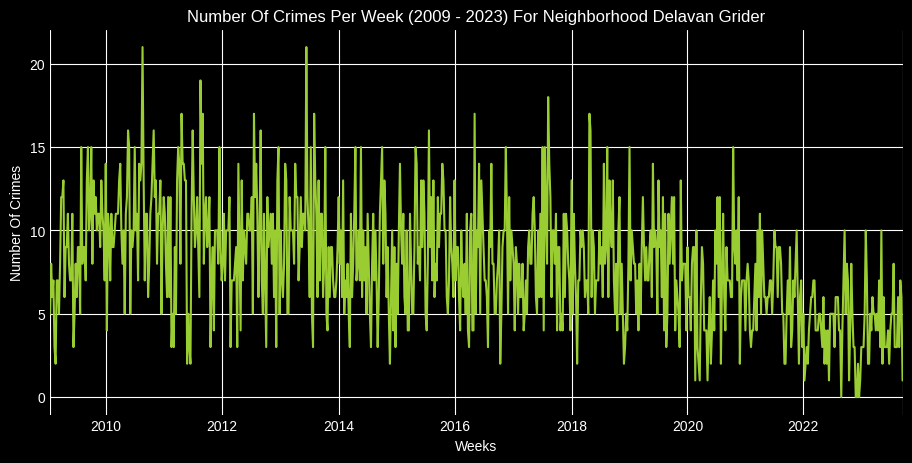

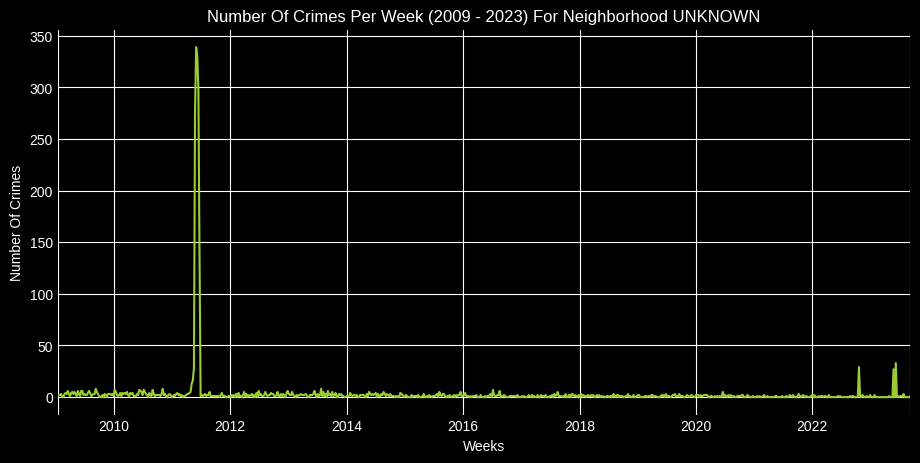

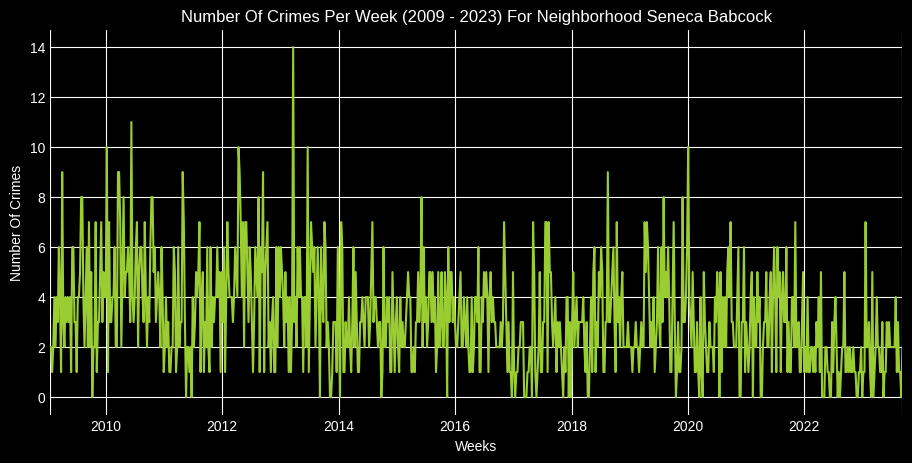

No data for neighborhood nan


In [236]:
# week of year per neigborhood

listOfNeighborhoods = list(data['neighborhood_1'].unique())

for neighborhood in listOfNeighborhoods:
    df = data[data['neighborhood_1'] == neighborhood]

    # Check if df is empty before resampling and plotting
    if not df.empty:
        plt.figure(figsize=(11, 5))
        df.resample('W').size().plot(legend=False, color='yellowgreen')
        plt.title('Number Of Crimes Per Week (2009 - 2023) For Neighborhood {}'.format(neighborhood))
        plt.xlabel('Weeks')
        plt.ylabel('Number Of Crimes')
        plt.show()
    else:
        print(f"No data for neighborhood {neighborhood}")


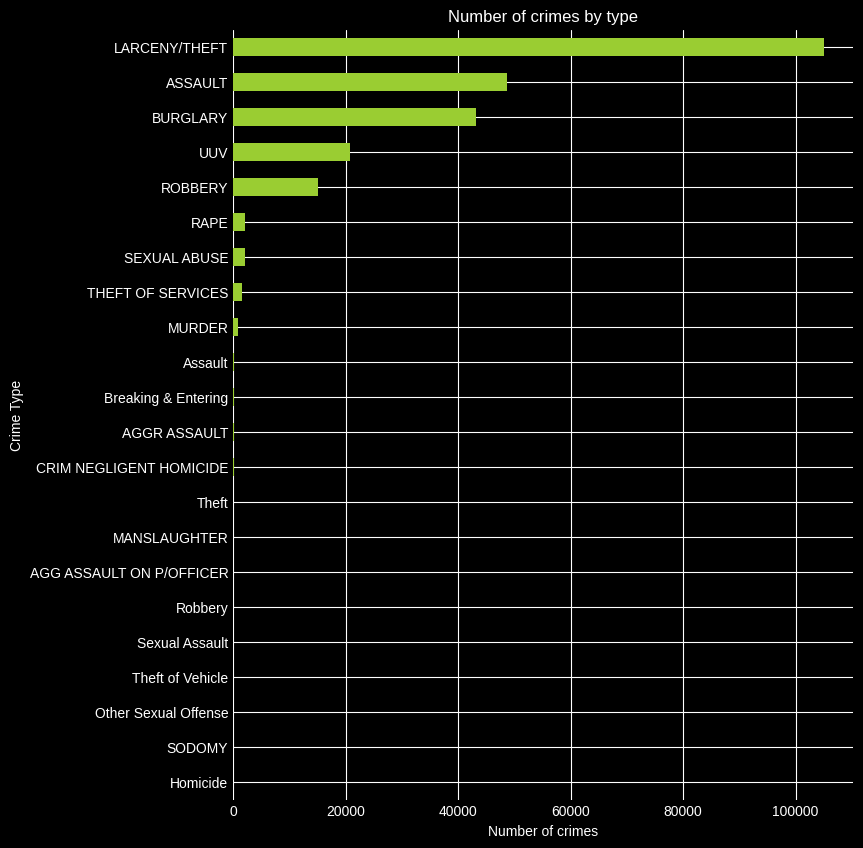

In [237]:
# bar chart of crimes
plt.figure(figsize=(8,10))
data.groupby([data['incident_type_primary']]).size().sort_values(ascending=True).plot(kind='barh', color='yellowgreen')
plt.title('Number of crimes by type')
plt.ylabel('Crime Type')
plt.xlabel('Number of crimes')
plt.show()

In [238]:
# chart of crimes
print(f'Percentage of Crimes by types:\n\n{data.incident_type_primary.value_counts(normalize=True)}')

Percentage of Crimes by types:

LARCENY/THEFT               0.438012
ASSAULT                     0.203365
BURGLARY                    0.180000
UUV                         0.086375
ROBBERY                     0.062623
RAPE                        0.009090
SEXUAL ABUSE                0.008685
THEFT OF SERVICES           0.006916
MURDER                      0.003216
Assault                     0.000480
Breaking & Entering         0.000346
AGGR ASSAULT                0.000321
CRIM NEGLIGENT HOMICIDE     0.000271
Theft                       0.000138
MANSLAUGHTER                0.000046
AGG ASSAULT ON P/OFFICER    0.000042
Robbery                     0.000025
Sexual Assault              0.000021
Theft of Vehicle            0.000013
Other Sexual Offense        0.000008
Homicide                    0.000004
SODOMY                      0.000004
Name: incident_type_primary, dtype: float64


### Remove Outlier Crimes / Maybe Label As Others Later

In [239]:
print('Current rows:', data.shape[0])
data['incident_type_primary'] = data['incident_type_primary'].astype(str)
data = data[(data['incident_type_primary'] != 'SODOMY') &
            (data['incident_type_primary'] != 'Homicide') &
            (data['incident_type_primary'] != 'Other Sexual Offense') &
            (data['incident_type_primary'] != 'Theft of Vehicle') &
            (data['incident_type_primary'] != 'Sexual Assault') &
            (data['incident_type_primary'] != 'Robbery') &
            (data['incident_type_primary'] != 'AGG ASSAULT ON P/OFFICER') &
            (data['incident_type_primary'] != 'Theft') &
            (data['incident_type_primary'] != 'CRIM NEGLIGENT HOMICIDE') &
            (data['incident_type_primary'] != 'AGGR ASSAULT') &
            (data['incident_type_primary'] != 'Breaking & Entering') &
            (data['incident_type_primary'] != 'Assault') &
            (data['incident_type_primary'] != 'MANSLAUGHTER')]

print('Rows after removing primary type outliers:', data.shape[0])

Current rows: 239722
Rows after removing primary type outliers: 239310


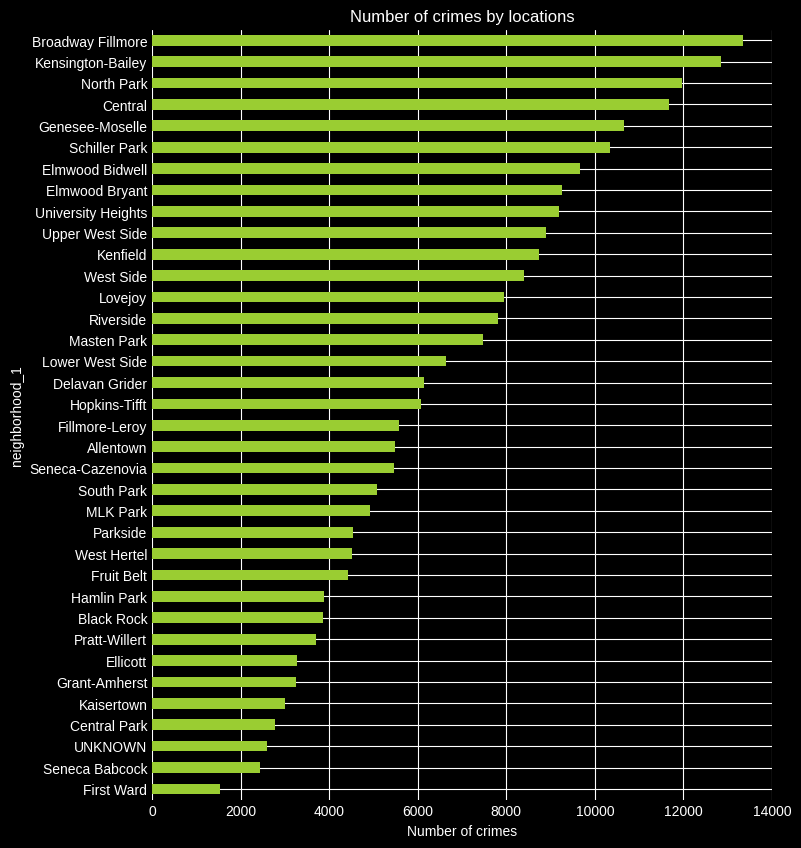

In [240]:
plt.figure(figsize=(8,10))
data.groupby([data['neighborhood_1']]).size().sort_values(ascending=True)[-70:].plot(kind='barh', color='yellowgreen')
plt.title('Number of crimes by locations')
plt.ylabel('neighborhood_1')
plt.xlabel('Number of crimes')
plt.show()

In [241]:
# Show 2022 vs 2009
# possible show ratio

In [242]:
# grab 2009 data and 2022 data to compare crime charts
data2009 = data[(data['Year'] == 2009)]
data2022 = data[(data['Year'] == 2022)]


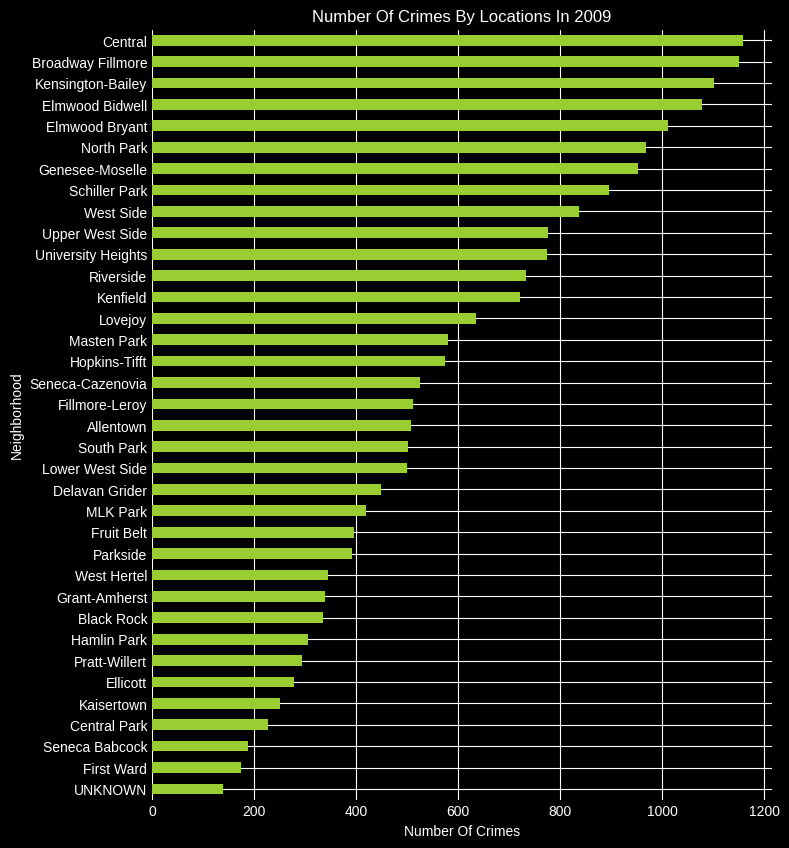

In [243]:
# 2009 crimes by location

plt.figure(figsize=(8,10))
data2009.groupby([data2009['neighborhood_1']]).size().sort_values(ascending=True)[-70:].plot(kind='barh', color='yellowgreen')
plt.title('Number Of Crimes By Locations In 2009')
plt.ylabel('Neighborhood')
plt.xlabel('Number Of Crimes')
plt.show()

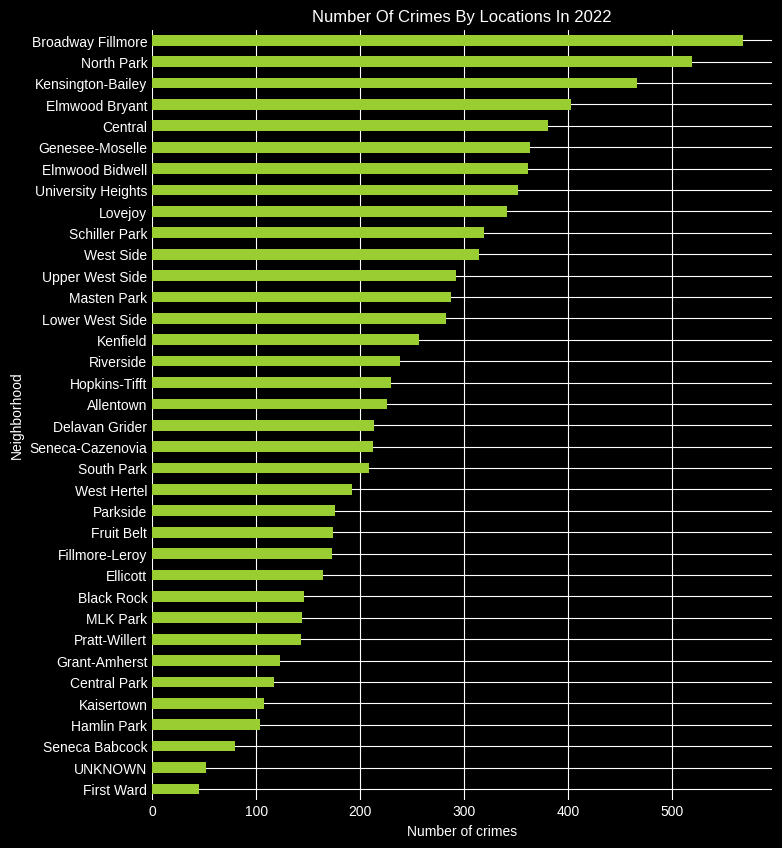

In [244]:
# 2022 crimes by location

plt.figure(figsize=(8,10))
data2022.groupby([data2022['neighborhood_1']]).size().sort_values(ascending=True)[-70:].plot(kind='barh', color='yellowgreen')
plt.title('Number Of Crimes By Locations In 2022')
plt.ylabel('Neighborhood')
plt.xlabel('Number of crimes')
plt.show()

In [245]:
import plotly.graph_objects as go

# Filter data for 2009 and 2022
data2009 = data[data['Year'] == 2009]
data2022 = data[data['Year'] == 2022]

# Create subplots
fig = go.Figure()

# Subplot 1: 2009 crimes by location
fig.add_trace(go.Bar(
    y=data2009.groupby([data2009['neighborhood_1']]).size().sort_values(ascending=True)[-70:].index,
    x=data2009.groupby([data2009['neighborhood_1']]).size().sort_values(ascending=True)[-70:],
    orientation='h',
    marker=dict(color='deepskyblue'),
    name='2009'
))

# Subplot 2: 2022 crimes by location
fig.add_trace(go.Bar(
    y=data2022.groupby([data2022['neighborhood_1']]).size().sort_values(ascending=True)[-70:].index,
    x=data2022.groupby([data2022['neighborhood_1']]).size().sort_values(ascending=True)[-70:],
    orientation='h',
    marker=dict(color='orchid'),
    name='2022'
))

# Update layout for dark theme
fig.update_layout(
    title='Number of Crimes by Locations (2009 and 2022)',
    yaxis_title='Neighborhood',
    xaxis_title='Number of Crimes',
    barmode='group',
    width=1000,
    height=500,
    plot_bgcolor='black',  # Set background color to black
    paper_bgcolor='black',  # Set paper color to black
    font=dict(color='white')  # Set text color to white
)

# Show plot
fig.show()


### Buffalo Crime Geospatial Graphs
<a id='graphs'></a>

In [246]:
# make new data frame with map data
buffalo_map = data[['neighborhood_1','incident_type_primary', 'latitude', 'longitude',  'incident_datetime', 'hour_of_day']]

In [247]:
buffalo_map['latitude'] = pd.to_numeric(buffalo_map['latitude'])
buffalo_map['longitude'] = pd.to_numeric(buffalo_map['longitude'])
buffalo_map['hour_of_day'] = pd.to_numeric(buffalo_map['hour_of_day'])


In [248]:
buffalo_map['incident_datetime'] = pd.to_datetime(buffalo_map['incident_datetime'])
buffalo_map['Year'] = buffalo_map['incident_datetime'].dt.year
buffalo_map['Month'] = buffalo_map['incident_datetime'].dt.month

In [249]:
buffalo_map.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 239310 entries, 2009-01-10 12:19:00 to 2023-09-11 11:12:45
Data columns (total 8 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   neighborhood_1         237303 non-null  object        
 1   incident_type_primary  239310 non-null  object        
 2   latitude               234651 non-null  float64       
 3   longitude              234651 non-null  float64       
 4   incident_datetime      239310 non-null  datetime64[ns]
 5   hour_of_day            239310 non-null  int64         
 6   Year                   239310 non-null  int64         
 7   Month                  239310 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 16.4+ MB


In [250]:
# buffalo lat and lon mean
mean_latitude = buffalo_map['latitude'].mean()
print(mean_latitude)
mean_longitude = buffalo_map['longitude'].mean()
print(mean_longitude)

42.911893612215586
-78.84912654111854


In [251]:
# remove outliers that are not in the city limits
buffalo_map = buffalo_map[(buffalo_map['longitude'] < -78.80)]
buffalo_map = buffalo_map[(buffalo_map['latitude'] < 43)]
#buffalo_map.sort_values('Latitude', ascending=False)

In [252]:
#ignoring unknown neighborhoods
buffalo_map = buffalo_map[buffalo_map['neighborhood_1'] != 'UNKNOWN']

Text(0.5, 1.0, 'All Crime Distribution Per Neighborhood')

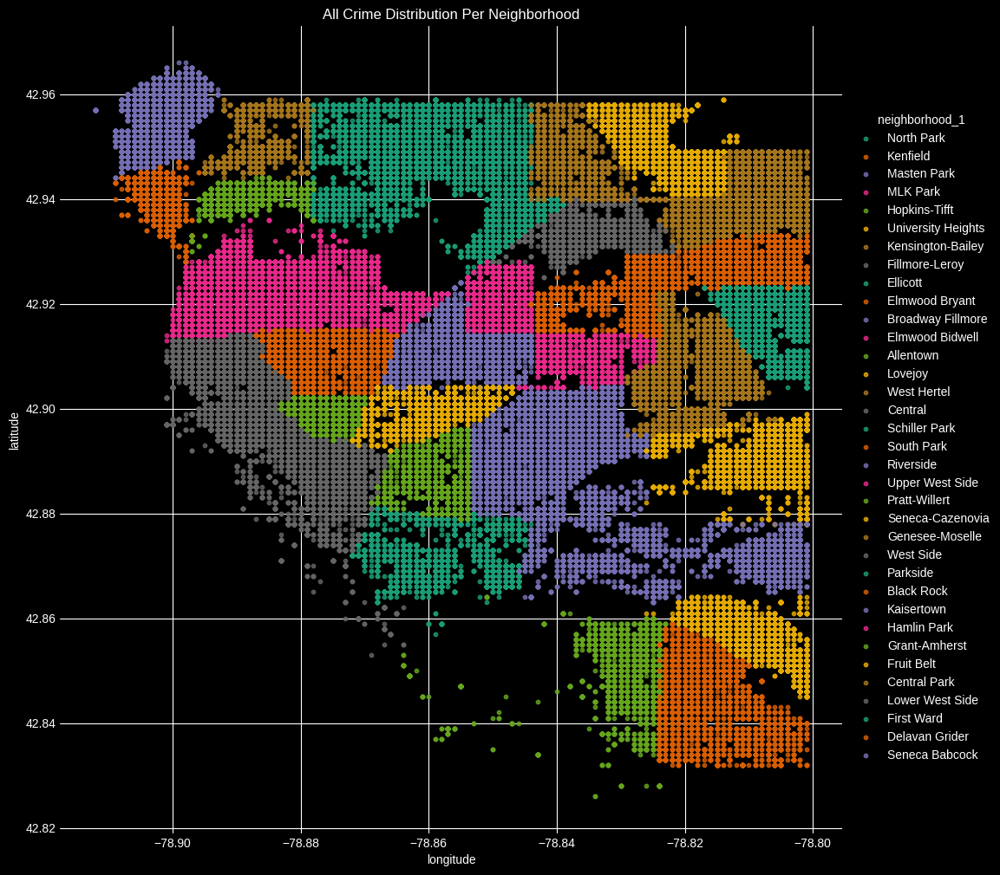

In [253]:
# all crimes per neighborhood
sns.lmplot(x = 'longitude',
           y = 'latitude',
           data=buffalo_map[:],
           fit_reg=False,
           hue="neighborhood_1",
           palette='Dark2',
           height=10,
           ci=2,
           scatter_kws={"marker": "D",
                        "s": 10})
ax = plt.gca()
ax.set_title("All Crime Distribution Per Neighborhood")

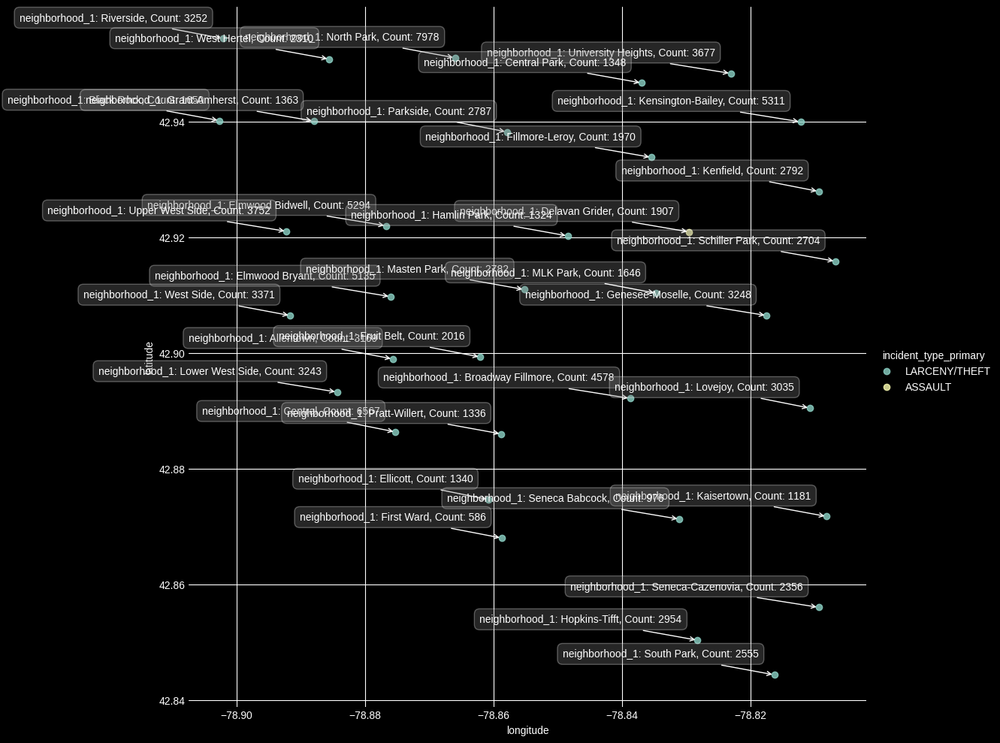

In [254]:
# show most common crime per neighborhood
# preprocessing to group most common crime per neighborhood
sdf = buffalo_map.groupby(['neighborhood_1', 'incident_type_primary']).size().reset_index(name='counts')
idx = sdf.groupby(['neighborhood_1'])['counts'].transform(max) == sdf['counts']
sdf = sdf[idx]
other = buffalo_map.groupby('neighborhood_1')[['longitude', 'latitude']].mean()

sdf = sdf.set_index('neighborhood_1').join(other)
sdf = sdf.reset_index().sort_values("counts",ascending=False)
#sns.lmplot(x='longitude', y='latitude',height=10, hue=incident_type_primary', data=sdf,scatter_kws={"s": sdf['counts'].apply(lambda x: x/100.0)}, fit_reg=False)


#  scatter plot
sns.lmplot(x='longitude', y='latitude', height=10, hue='incident_type_primary', data=sdf, fit_reg=False, scatter=True)

# Annotation code...
for r in sdf.reset_index().to_numpy():
    neighborhood_ = "neighborhood_1: {0}, Count: {1}".format(r[1], int(r[3]))

    #neighborhood_ = "neighborhood_1 {0}, Count : {1}".format(int(r[1]), int(r[3]))
    x = r[4]
    y = r[5]
    plt.annotate(
        neighborhood_,
        xy=(x, y), xytext=(-15, 15),
        textcoords='offset points', ha='right', va='bottom',
        bbox=dict(boxstyle='round,pad=0.5', fc='grey', alpha=0.3),
        arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))

plt.show()

The graph above distinctly highlights that, across Buffalo neighborhoods, the prevailing type of crime is predominantly larceny or theft. However, a notable exception to this pattern is the Delavan Grider neighborhood, where the dominant crime category is assault.

In [255]:
# buffalo lat and lon mean
mean_latitude = buffalo_map['latitude'].mean()
print(mean_latitude)
mean_longitude = buffalo_map['longitude'].mean()
print(mean_longitude)

42.91184928528912
-78.84964614694492


In [256]:
# interactive map of buffalo showing crime amount per neighborhood

sdf = buffalo_map.groupby(['neighborhood_1', 'incident_type_primary']).size().reset_index(name='counts')
idx = sdf.groupby(['neighborhood_1'])['counts'].transform(max) == sdf['counts']
sdf = sdf[idx]
other = buffalo_map.groupby('neighborhood_1')[['longitude', 'latitude']].mean()

sdf = sdf.set_index('neighborhood_1').join(other)
sdf = sdf.reset_index().sort_values("counts", ascending=False)

# Create a Folium map centered around Buffalo, New York
m = folium.Map(location=[mean_latitude, mean_longitude], zoom_start=12)

# Create the scatter plot
for _, row in sdf.iterrows():
    district = f"neighborhood_1: {row['neighborhood_1']}, Count: {int(row['counts'])}"
    x = row['latitude']
    y = row['longitude']

    # Add a marker for each point on the map
    folium.Marker([x, y], tooltip=district).add_to(m)

m

# Buffalo Crime Heatmap
<a id='heatmap'></a>

In [257]:
"""
This function generates a folium map with Buffalo location and given zoom value.
"""

def generateBaseMap(default_location=[mean_latitude, mean_longitude], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [258]:
buffalo_map.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 231842 entries, 2009-01-10 12:19:00 to 2023-09-11 11:12:45
Data columns (total 8 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   neighborhood_1         231842 non-null  object        
 1   incident_type_primary  231842 non-null  object        
 2   latitude               231842 non-null  float64       
 3   longitude              231842 non-null  float64       
 4   incident_datetime      231842 non-null  datetime64[ns]
 5   hour_of_day            231842 non-null  int64         
 6   Year                   231842 non-null  int64         
 7   Month                  231842 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 15.9+ MB


In [259]:
buffalo_map.head()

,neighborhood_1,incident_type_primary,latitude,longitude,incident_datetime,hour_of_day,Year,Month
incident_datetime,,,,,,,,
2009-01-10 12:19:00,North Park,BURGLARY,42.955,-78.857,2009-01-10 12:19:00,12,2009,1
2009-01-10 12:21:00,Kenfield,BURGLARY,42.928,-78.818,2009-01-10 12:21:00,12,2009,1
2009-01-10 12:27:00,Masten Park,UUV,42.917,-78.863,2009-01-10 12:27:00,12,2009,1
2009-01-10 12:30:00,Masten Park,ASSAULT,42.915,-78.854,2009-01-10 12:30:00,12,2009,1
2009-01-10 12:30:00,MLK Park,BURGLARY,42.910,-78.835,2009-01-10 12:30:00,12,2009,1


In [260]:
# make night & day column
buffalo_map['dayType'] = buffalo_map['hour_of_day'].apply(lambda x: 'Day' if (x >= 6 and x < 18) else 'Night')

In [261]:
# grab summer 2023 data
summer_2023 = buffalo_map.loc[(buffalo_map['Year'] == 2023) & (buffalo_map['Month'] > 5) & (buffalo_map['Month'] < 9)]
# grab summer 2009 data
summer_2009 = buffalo_map.loc[(buffalo_map['Year'] == 2009) & (buffalo_map['Month'] > 5) & (buffalo_map['Month'] < 9)]

In [262]:
print(type(summer_2023))
print(type(summer_2009))
print(summer_2023.shape)
print(summer_2009.shape)

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
(2835, 9)
(5811, 9)


In [263]:
# make day and night data dfor summer 2023 & summer 2009

summer_2023_day = summer_2023[summer_2023['dayType'] == 'Day']
summer_2023_night = summer_2023[summer_2023['dayType'] == 'Night']
summer_2009_day = summer_2009[summer_2009['dayType'] == 'Day']
summer_2009_night = summer_2009[summer_2009['dayType'] == 'Night']

In [264]:
# Heatmap --> 2023 Summer Days
base_map = generateBaseMap()
HeatMap(data=summer_2023_day[['latitude', 'longitude']].\
        groupby(['latitude', 'longitude']).sum().reset_index().values.tolist(), radius=8, max_zoom=12).add_to(base_map)

base_map

In [265]:
# Heatmap --> 2023 Summer Nights
base_map = generateBaseMap()
HeatMap(data=summer_2023_night[['latitude', 'longitude']].\
        groupby(['latitude', 'longitude']).sum().reset_index().values.tolist(), radius=8, max_zoom=12).add_to(base_map)

base_map

Upon comparing the day and night heatmaps for Summer 2023, it becomes evident that there is a higher incidence of crime during daylight hours compared to nighttime.

In [266]:
# Heatmap --> 2009 Summer Days
base_map = generateBaseMap()
HeatMap(data=summer_2009_day[['latitude', 'longitude']].\
        groupby(['latitude', 'longitude']).sum().reset_index().values.tolist(), radius=8, max_zoom=12).add_to(base_map)

base_map

In [267]:
# Heatmap --> 2009 Summer Nights
base_map = generateBaseMap()
HeatMap(data=summer_2009_night[['latitude', 'longitude']].\
        groupby(['latitude', 'longitude']).sum().reset_index().values.tolist(), radius=8, max_zoom=12).add_to(base_map)

base_map

# Crime Forecasting
<a id='forecasting'></a>

In [268]:
import warnings
#warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
from numpy import mean
from numpy import array
from prettytable import PrettyTable
from tqdm import tqdm_notebook

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Bidirectional
from keras.layers import Flatten
from keras.layers import TimeDistributed
from keras.layers import Conv1D
from keras.layers import MaxPooling1D

from sklearn.metrics import mean_squared_error

In [269]:
data['latitude'] = pd.to_numeric(data['latitude'])
data['longitude'] = pd.to_numeric(data['longitude'])
data['hour_of_day'] = pd.to_numeric(data['hour_of_day'])
#ignoring unknown neighborhoods
data = data[data['neighborhood_1'] != 'UNKNOWN']

In [270]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 236726 entries, 2009-01-10 12:19:00 to 2023-09-11 11:12:45
Data columns (total 35 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   case_number              236726 non-null  object 
 1   incident_datetime        236726 non-null  object 
 2   incident_type_primary    236726 non-null  object 
 3   incident_description     236726 non-null  object 
 4   parent_incident_type     236726 non-null  object 
 5   hour_of_day              236726 non-null  int64  
 6   day_of_week              236726 non-null  object 
 7   address_1                236710 non-null  object 
 8   city                     236726 non-null  object 
 9   state                    236726 non-null  object 
 10  location                 234291 non-null  object 
 11  latitude                 234291 non-null  float64
 12  longitude                234291 non-null  float64
 13  created_at               

In [271]:
# function to split training and test data

def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [272]:
# decide on the training and test set by using dates

data_tr = data.loc['2011-01-01':'2022-12-31']
data_test = data.loc['2023-01-01':'2023-09-01']

In [273]:
listOfNeigh = list(data['neighborhood_1'].unique())

In [274]:
train_d = []
for neigh in listOfNeigh:
    df = data_tr[data_tr['neighborhood_1'] == neigh]
    df_gr = df.groupby(['Year', 'Month']).count()
    train_d.append(list(df_gr['incident_datetime'].values))

In [275]:
test_d = []
for neigh in listOfNeigh:
    df = data_test[data_test['neighborhood_1'] == neigh]
    df_gr = df.groupby(['Month']).count()
    test_d.append(list(df_gr['incident_datetime'].values))

In [276]:
data_test['neighborhood_1'].unique()

array(['South Park', 'Hopkins-Tifft', 'Lower West Side', 'Central',
       'Lovejoy', 'North Park', 'Kensington-Bailey', 'Elmwood Bryant',
       'Pratt-Willert', 'Masten Park', 'West Hertel',
       'University Heights', 'Broadway Fillmore', 'Elmwood Bidwell',
       'Genesee-Moselle', 'Upper West Side', 'West Side', 'Hamlin Park',
       'Ellicott', 'Seneca Babcock', 'Kenfield', nan, 'First Ward',
       'Allentown', 'Black Rock', 'Delavan Grider', 'Schiller Park',
       'Riverside', 'Fruit Belt', 'Central Park', 'MLK Park', 'Parkside',
       'Kaisertown', 'Seneca-Cazenovia', 'Grant-Amherst',
       'Fillmore-Leroy'], dtype=object)

# Crime Projection On The Last Eight Months Using Simple Moving Average

Neighborhood: South Park
Actuals: [67, 50, 72, 65, 63, 58, 45, 55, 1]
Predictions: [41.2, 43.8, 46.0, 50.2, 59.8, 63.4, 61.6, 60.6, 57.2]


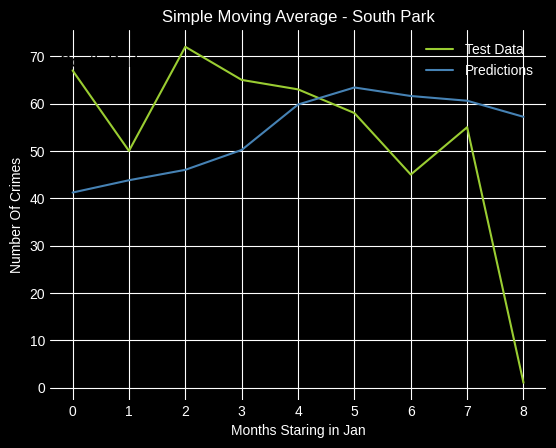

Neighborhood: Hopkins-Tifft
Actuals: [30, 16, 17, 35, 16, 27, 18, 33, 2]
Predictions: [22.6, 24.2, 21.2, 18.8, 23.0, 22.8, 22.2, 22.6, 25.8]


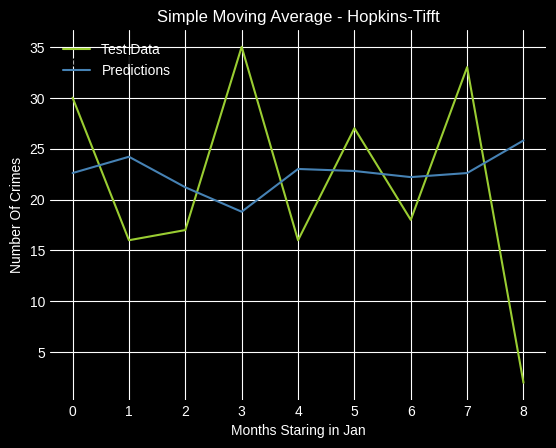

Neighborhood: Lower West Side
Actuals: [28, 16, 24, 25, 31, 30, 35, 27, 1]
Predictions: [23.6, 23.6, 21.6, 21.2, 24.2, 24.8, 25.2, 29.0, 29.6]


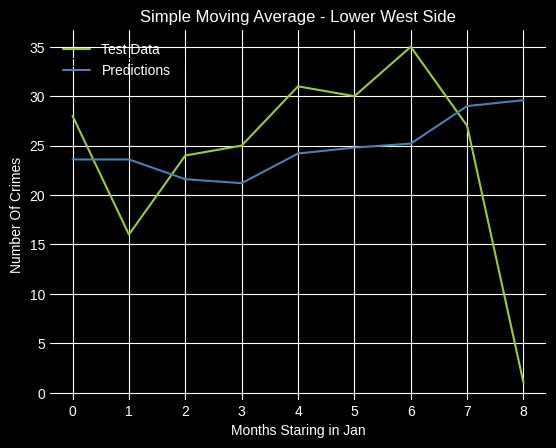

Neighborhood: Central
Actuals: [16, 11, 7, 15, 16, 20, 16, 13, 2]
Predictions: [11.4, 12.4, 11.8, 9.6, 11.4, 13.0, 13.8, 14.8, 16.0]


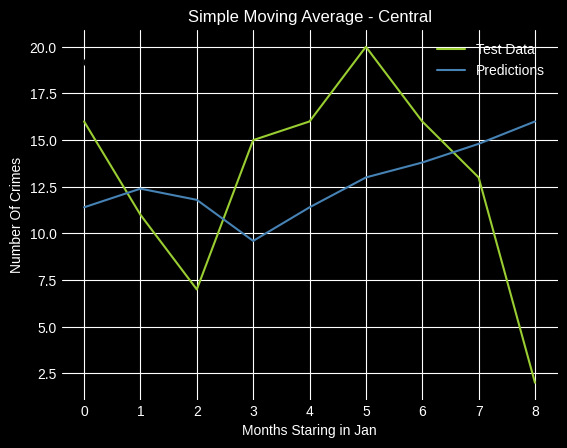

Neighborhood: Lovejoy
Actuals: [23, 13, 23, 21, 28, 17, 15, 23, 3]
Predictions: [18.8, 17.8, 15.8, 16.0, 18.4, 21.6, 20.4, 20.8, 20.8]


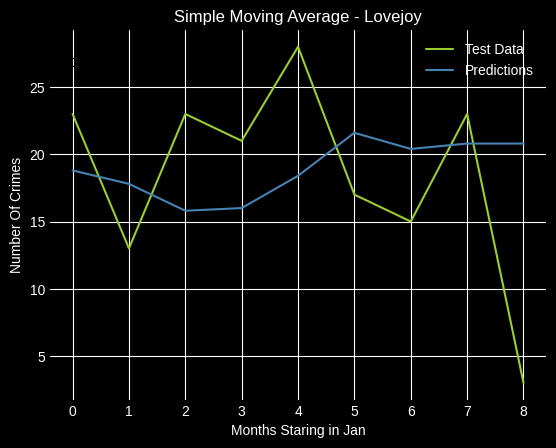

Neighborhood: North Park
Actuals: [18, 19, 21, 24, 19, 28, 34, 33, 1]
Predictions: [24.8, 20.4, 19.4, 18.2, 19.4, 20.2, 22.2, 25.2, 27.6]


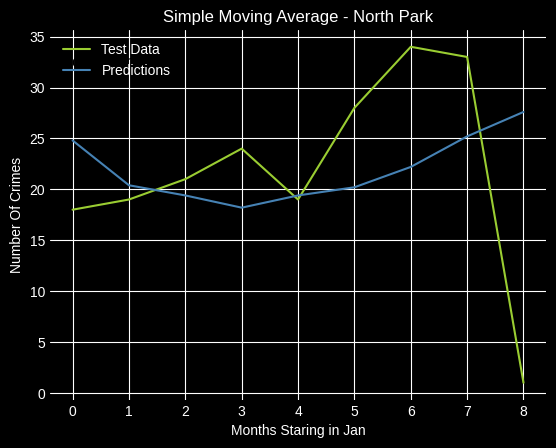

Neighborhood: Kensington-Bailey
Actuals: [32, 27, 30, 36, 40, 34, 34, 41]
Predictions: [28.2, 28.8, 26.6, 27.2, 30.8, 33.0, 33.4, 34.8]


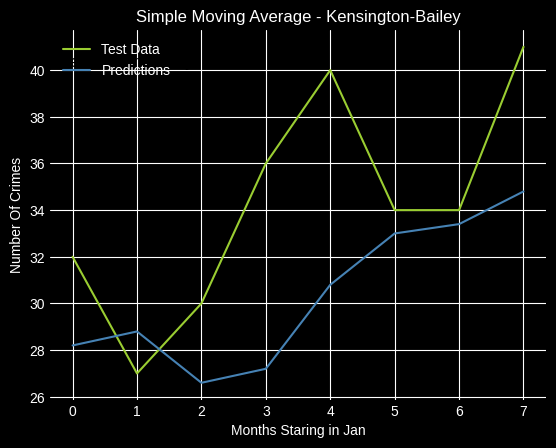

Neighborhood: Elmwood Bryant
Actuals: [41, 39, 52, 44, 45, 45, 42, 53]
Predictions: [40.0, 39.2, 36.8, 38.4, 41.8, 44.2, 45.0, 45.6]


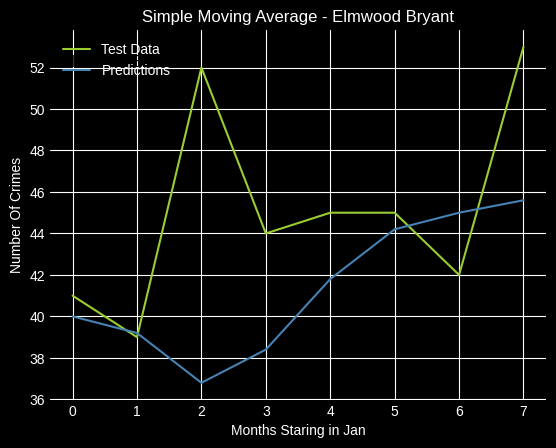

Neighborhood: Pratt-Willert
Actuals: [8, 10, 14, 13, 17, 20, 18, 29, 1]
Predictions: [13.4, 11.4, 9.4, 9.4, 11.0, 12.4, 14.8, 16.4, 19.4]


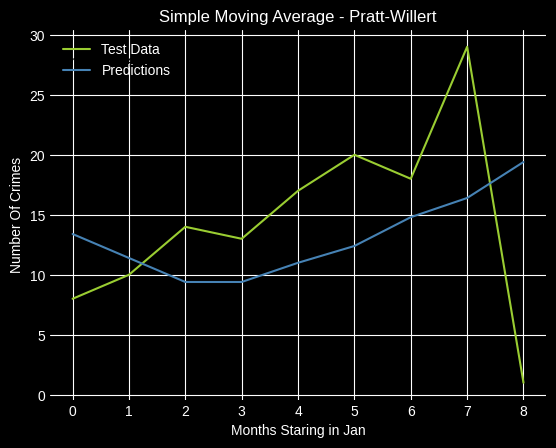

Neighborhood: Masten Park
Actuals: [33, 21, 20, 10, 19, 15, 14, 24]
Predictions: [16.0, 19.2, 19.0, 18.4, 18.0, 20.6, 17.0, 15.6]


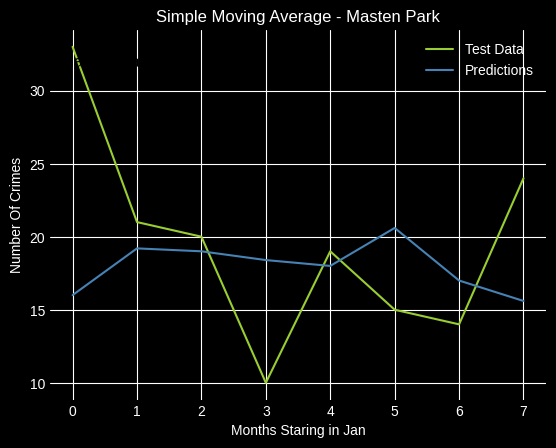

Neighborhood: West Hertel
Actuals: [39, 28, 26, 34, 39, 47, 50, 62, 1]
Predictions: [35.6, 33.6, 30.4, 28.0, 32.0, 33.2, 34.8, 39.2, 46.4]


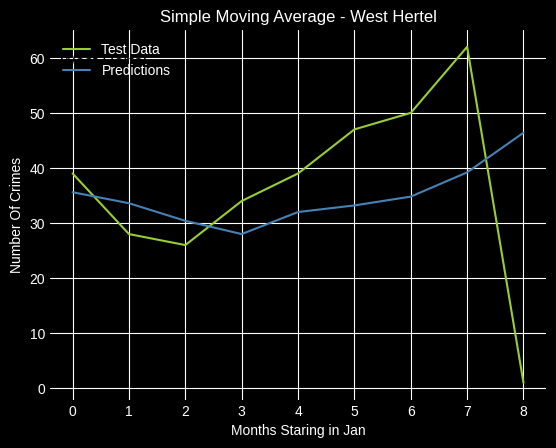

Neighborhood: University Heights
Actuals: [45, 46, 43, 41, 43, 60, 90, 58, 2]
Predictions: [41.0, 39.4, 40.8, 38.8, 42.0, 43.6, 46.6, 55.4, 58.4]


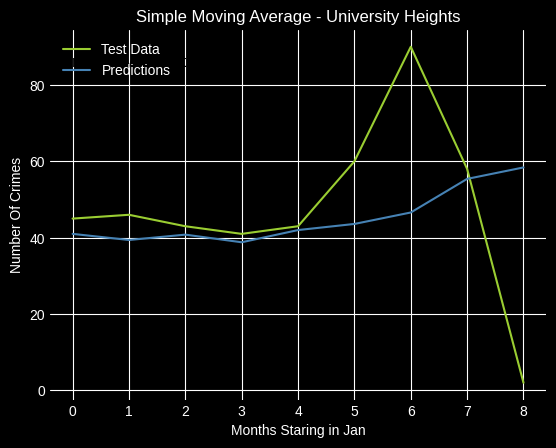

Neighborhood: Broadway Fillmore
Actuals: [56, 21, 27, 39, 53, 60, 51, 48, 1]
Predictions: [33.0, 34.2, 30.6, 28.4, 33.0, 39.2, 40.0, 46.0, 50.2]


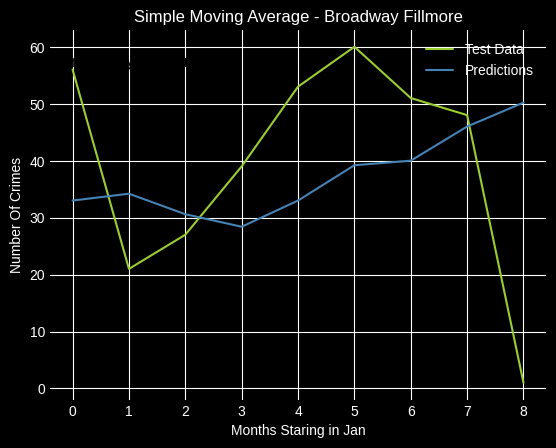

Neighborhood: Elmwood Bidwell
Actuals: [34, 22, 19, 24, 24, 30, 43, 43, 3]
Predictions: [22.4, 23.8, 22.8, 21.4, 22.8, 24.6, 23.8, 28.0, 32.8]


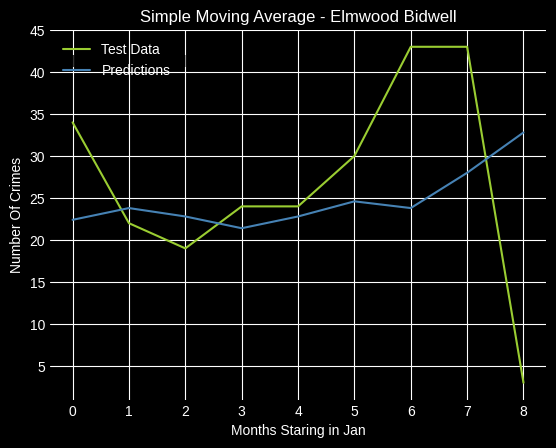

Neighborhood: Genesee-Moselle
Actuals: [32, 26, 29, 29, 34, 26, 33, 38]
Predictions: [31.0, 29.8, 28.0, 24.8, 27.6, 30.0, 28.8, 30.2]


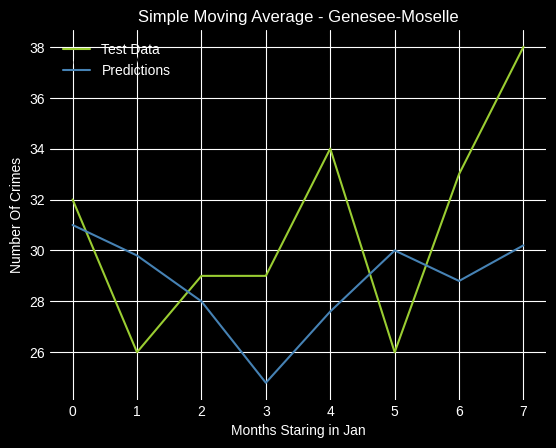

Neighborhood: Upper West Side
Actuals: [18, 7, 18, 14, 10, 19, 13, 27]
Predictions: [15.8, 16.4, 13.6, 13.4, 15.0, 13.4, 13.6, 14.8]


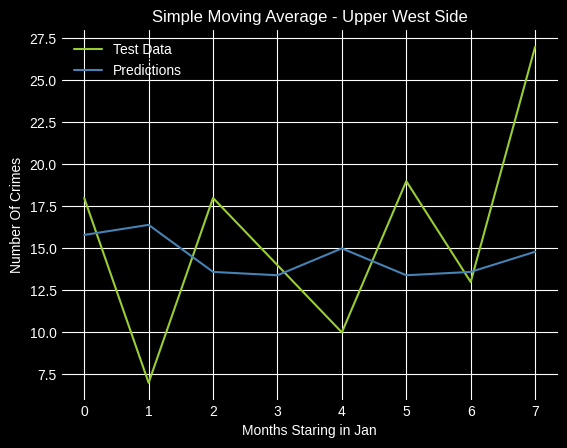

Neighborhood: West Side
Actuals: [36, 24, 40, 40, 52, 60, 51, 52, 5]
Predictions: [35.8, 34.0, 29.6, 29.0, 33.2, 38.4, 43.2, 48.6, 51.0]


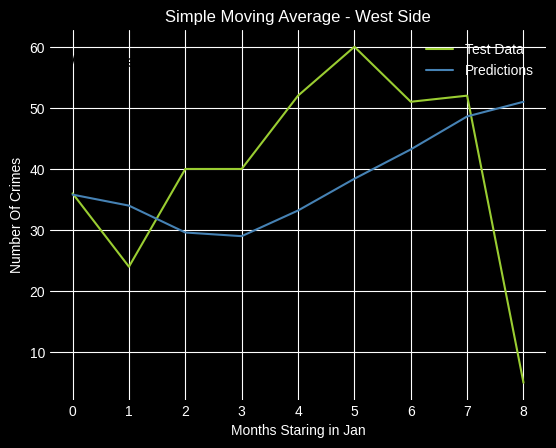

Neighborhood: Hamlin Park
Actuals: [30, 15, 11, 13, 30, 19, 20, 15, 1]
Predictions: [17.6, 19.0, 17.6, 16.2, 16.6, 19.8, 17.6, 18.6, 19.4]


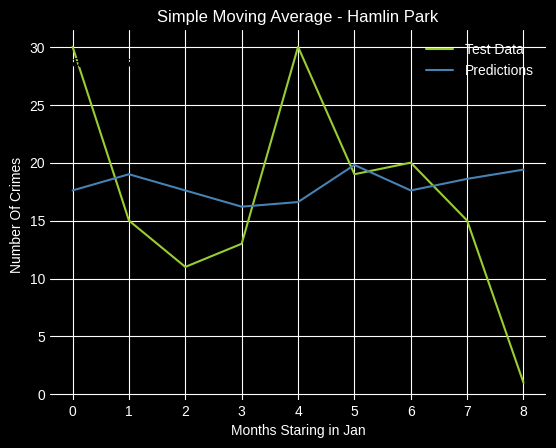

Neighborhood: Ellicott
Actuals: [27, 15, 17, 16, 21, 20, 35, 21, 1]
Predictions: [17.6, 19.0, 17.0, 16.6, 18.8, 19.2, 17.8, 21.8, 22.6]


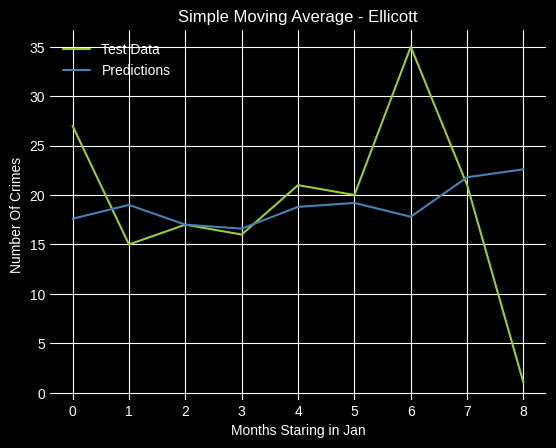

Neighborhood: Seneca Babcock
Actuals: [33, 19, 40, 34, 37, 40, 44, 30, 1]
Predictions: [26.0, 25.2, 23.2, 25.6, 30.6, 32.6, 34.0, 39.0, 37.0]


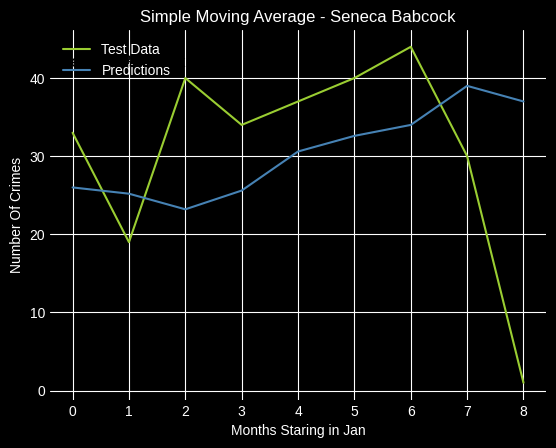

Neighborhood: Kenfield
Actuals: [13, 14, 16, 14, 20, 16, 17, 14]
Predictions: [14.2, 13.0, 13.6, 14.2, 14.8, 15.4, 16.0, 16.6]


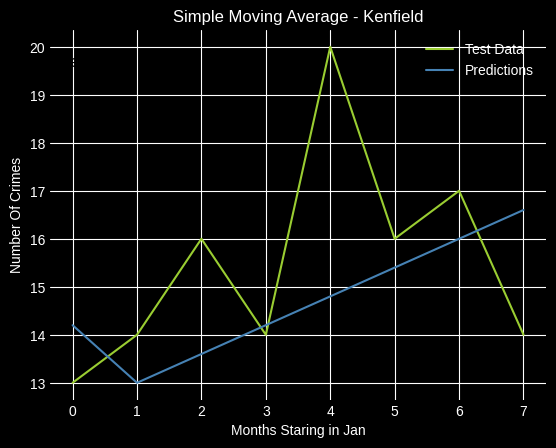

Neighborhood: nan
Actuals: [14, 18, 22, 25, 30, 22, 16, 11]
Predictions: [18.6, 17.0, 17.4, 18.2, 21.2, 21.8, 23.4, 23.0]


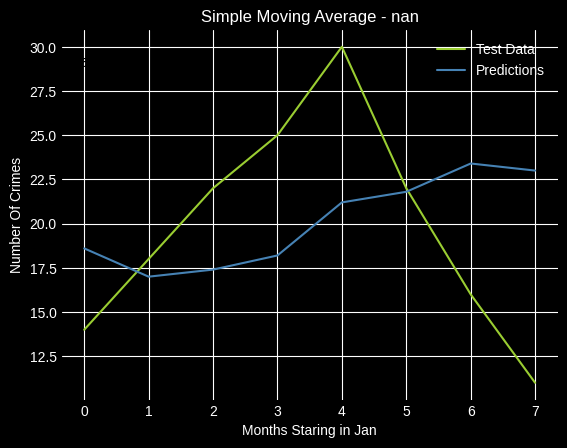

Neighborhood: First Ward
Actuals: [29, 26, 29, 39, 30, 36, 37, 26]
Predictions: [25.6, 25.2, 24.2, 23.4, 28.2, 30.6, 32.0, 34.2]


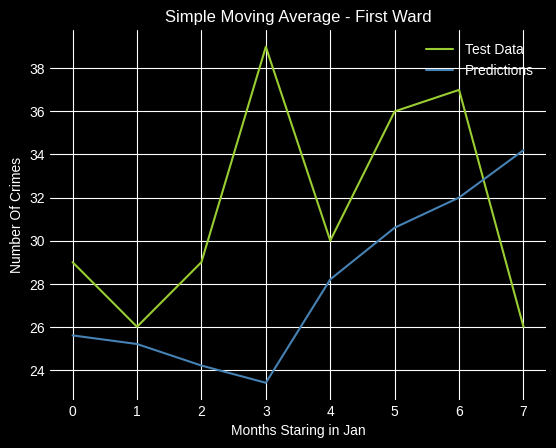

Neighborhood: Allentown
Actuals: [33, 27, 26, 37, 39, 30, 32, 41]
Predictions: [31.2, 33.0, 28.6, 27.4, 30.8, 32.4, 31.8, 32.8]


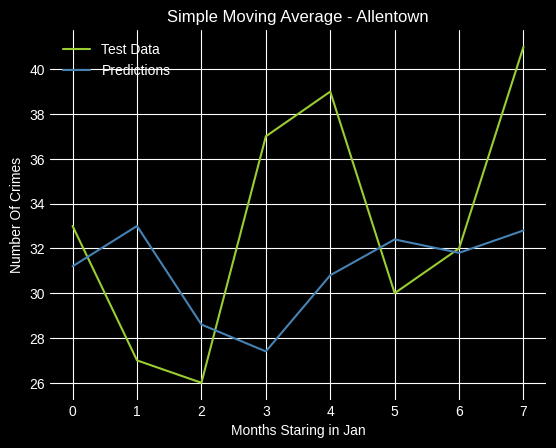

Neighborhood: Black Rock
Actuals: [12, 15, 14, 24, 21, 25, 23, 15]
Predictions: [13.6, 12.6, 13.2, 11.4, 15.2, 17.2, 19.8, 21.4]


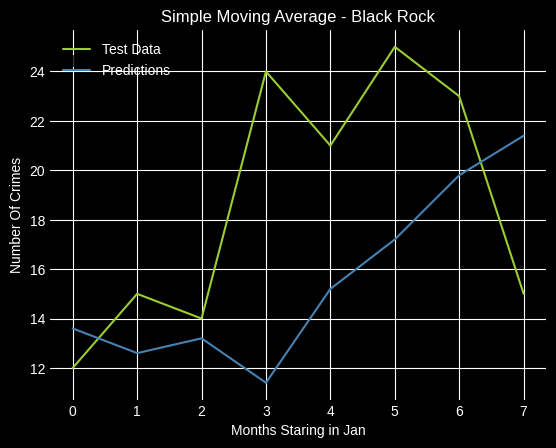

Neighborhood: Delavan Grider
Actuals: [16, 5, 13, 16, 24, 18, 18, 20]
Predictions: [14.8, 15.2, 12.4, 11.2, 13.2, 14.8, 15.2, 17.8]


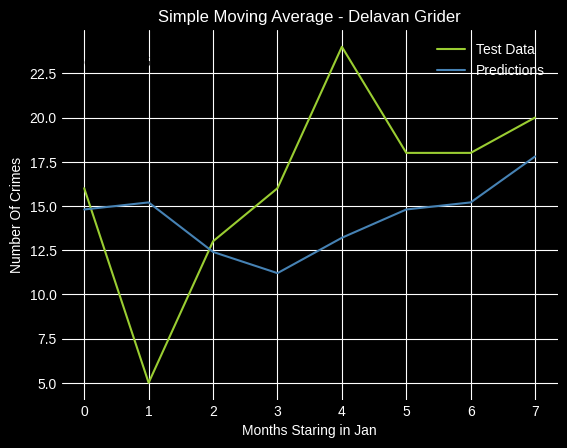

Neighborhood: Schiller Park
Actuals: [12, 12, 11, 20, 9, 13, 11, 14, 1]
Predictions: [8.4, 7.6, 7.6, 9.0, 12.0, 12.8, 13.0, 12.8, 13.4]


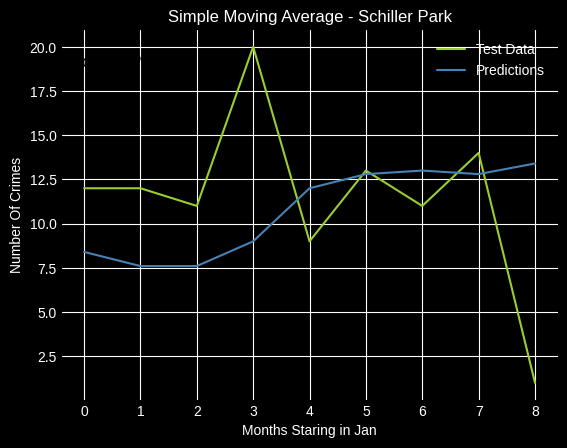

Neighborhood: Riverside
Actuals: [17, 12, 14, 6, 7, 15, 12, 7]
Predictions: [8.2, 9.6, 9.4, 10.8, 11.2, 11.2, 10.8, 10.8]


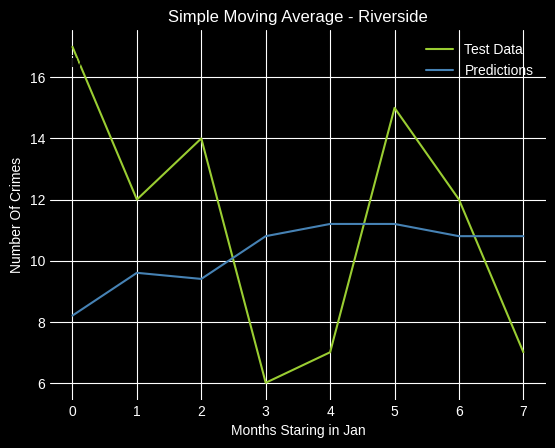

Neighborhood: Fruit Belt
Actuals: [12, 8, 4, 7, 13, 7, 8, 10]
Predictions: [7.6, 7.4, 8.2, 6.4, 7.0, 8.8, 7.8, 7.8]


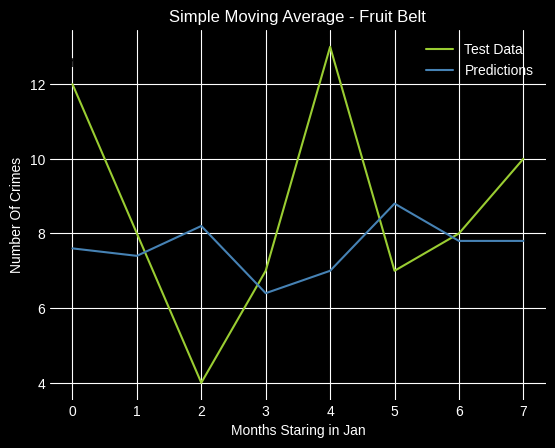

Neighborhood: Central Park
Actuals: [19, 16, 9, 17, 14, 18, 22, 17, 1]
Predictions: [14.0, 14.6, 14.4, 13.2, 14.4, 15.0, 14.8, 16.0, 17.6]


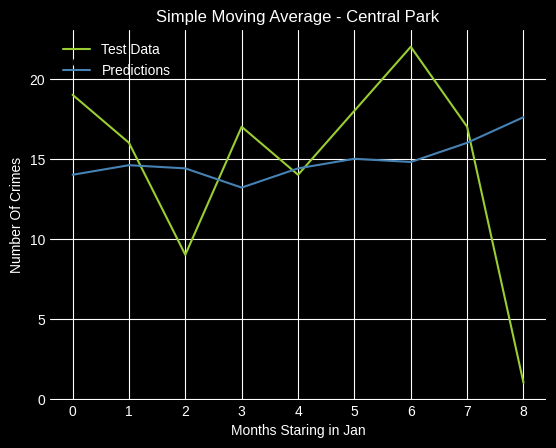

Neighborhood: MLK Park
Actuals: [10, 9, 7, 14, 14, 7, 4, 7]
Predictions: [8.4, 8.8, 8.4, 8.2, 10.2, 10.8, 10.2, 9.2]


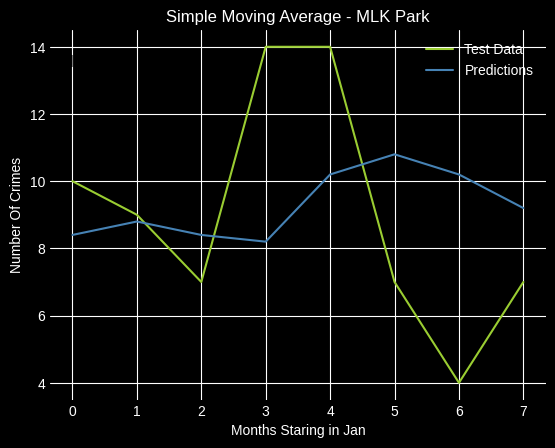

Neighborhood: Parkside
Actuals: [41, 17, 30, 32, 28, 24, 22, 27, 2]
Predictions: [26.4, 27.6, 24.6, 25.4, 28.8, 29.6, 26.2, 27.2, 26.6]


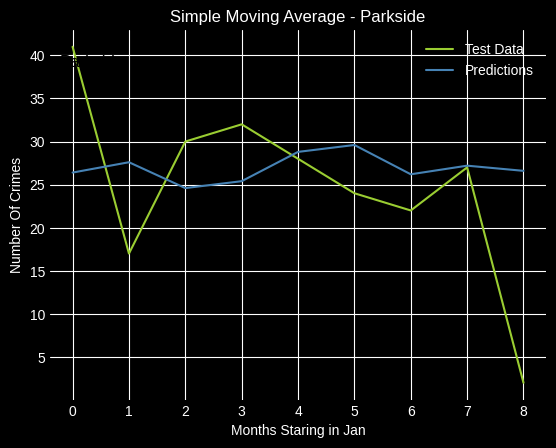

Neighborhood: Kaisertown
Actuals: [5, 2, 4, 2, 5, 5, 2, 4]
Predictions: [3.4, 3.2, 3.0, 3.4, 3.4, 3.6, 3.6, 3.6]


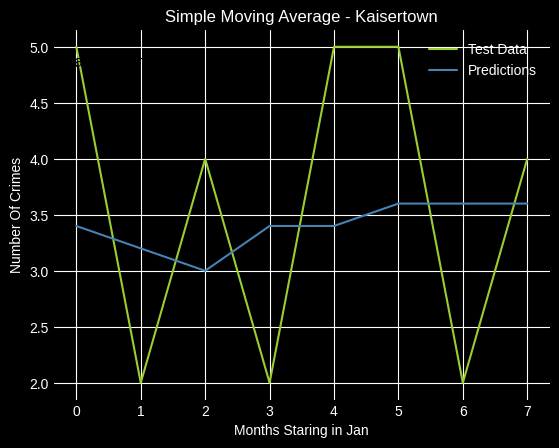

Neighborhood: Seneca-Cazenovia
Actuals: [25, 13, 20, 21, 22, 15, 22, 19, 1]
Predictions: [17.0, 18.8, 15.8, 14.8, 17.0, 20.2, 18.2, 20.0, 19.8]


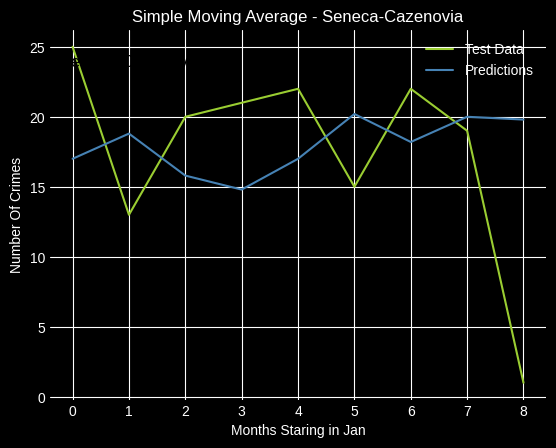

Neighborhood: Grant-Amherst
Actuals: [11, 9, 7, 8, 7, 8, 12, 6]
Predictions: [5.6, 6.8, 6.8, 7.0, 7.8, 8.4, 7.8, 8.4]


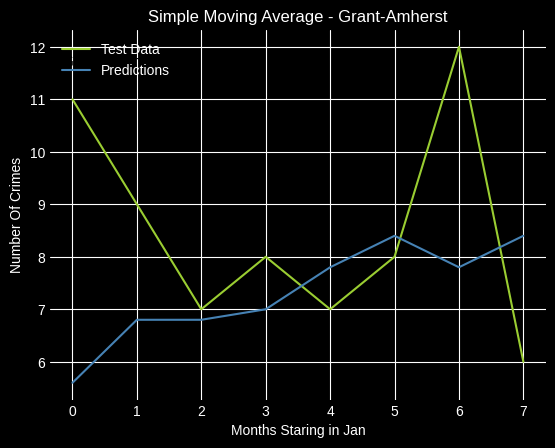

Test RMSE: 11.191


In [277]:
# Simple Moving Average
window = 5
predTot = list()
testTot = list()

# get unique neighborhood names
unique_neighborhoods = data_test['neighborhood_1'].unique()

# walk forward over time steps in test
for neighNum, neighborhood in enumerate(unique_neighborhoods):

    history = train_d[neighNum]
    test = test_d[neighNum]

    # check if there is test data for this neighborhood
    if len(test) == 0:
        continue  # skip neighborhoods with no test data

    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = mean([history[i] for i in range(length - window, length)])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)

    print('Neighborhood: {}'.format(neighborhood))
    print('Actuals: {}'.format(test))
    print('Predictions: {}'.format(preds))

    # plot
    plt.plot(test, color='yellowgreen')
    plt.plot(preds, color='steelblue')

    # Add neighborhood name as annotation
    plt.annotate(neighborhood, (0.02, 0.9), xycoords='axes fraction', fontsize=12, color='black')

    plt.title(f'Simple Moving Average - {neighborhood}')
    plt.xlabel('Months Staring in Jan')
    plt.ylabel('Number Of Crimes')
    plt.legend(['Test Data', 'Predictions'])
    plt.show()

    plt.show()

    testTot = testTot + test
    predTot = predTot + preds

error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)


# Crime Projection On The Last Eight Months Using Weighted Moving Average

Neighborhood: South Park
Actuals: [67, 50, 72, 65, 63, 58, 45, 55, 1]
Predictions: [35.93333333333333, 43.46666666666667, 45.06666666666667, 54.53333333333333, 59.86666666666667, 63.86666666666667, 62.06666666666667, 56.53333333333333, 54.666666666666664]


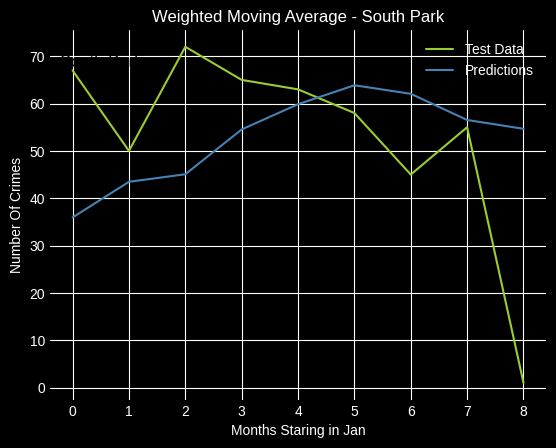

Neighborhood: Hopkins-Tifft
Actuals: [30, 16, 17, 35, 16, 27, 18, 33, 2]
Predictions: [17.733333333333334, 21.333333333333332, 19.333333333333332, 18.4, 23.533333333333335, 22.2, 23.6, 22.2, 25.666666666666668]


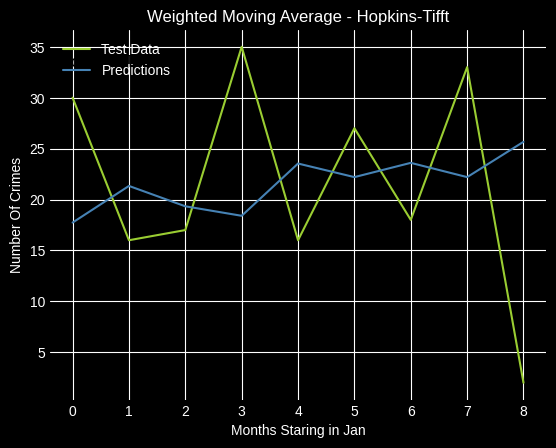

Neighborhood: Lower West Side
Actuals: [28, 16, 24, 25, 31, 30, 35, 27, 1]
Predictions: [20.6, 21.666666666666668, 18.933333333333334, 19.8, 21.733333333333334, 25.8, 27.533333333333335, 30.8, 30.133333333333333]


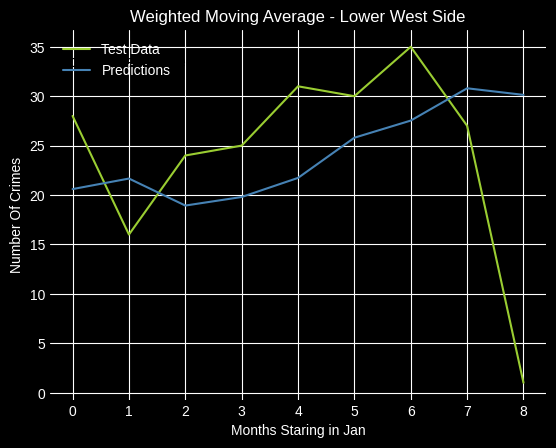

Neighborhood: Central
Actuals: [16, 11, 7, 15, 16, 20, 16, 13, 2]
Predictions: [11.066666666666666, 11.933333333333334, 11.133333333333333, 9.6, 11.333333333333334, 13.266666666666667, 15.6, 16.333333333333332, 15.733333333333333]


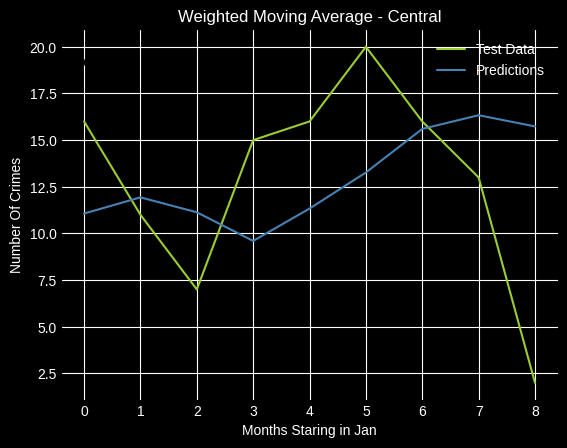

Neighborhood: Lovejoy
Actuals: [23, 13, 23, 21, 28, 17, 15, 23, 3]
Predictions: [14.266666666666667, 16.2, 15.133333333333333, 17.666666666666668, 19.0, 22.8, 21.266666666666666, 19.466666666666665, 20.2]


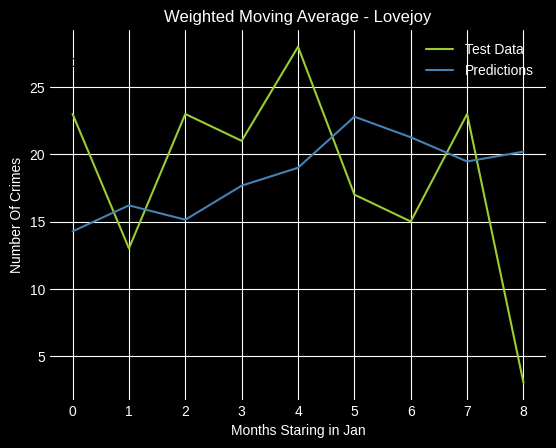

Neighborhood: North Park
Actuals: [18, 19, 21, 24, 19, 28, 34, 33, 1]
Predictions: [20.933333333333334, 19.266666666666666, 18.0, 18.0, 19.866666666666667, 20.666666666666668, 23.266666666666666, 27.2, 29.8]


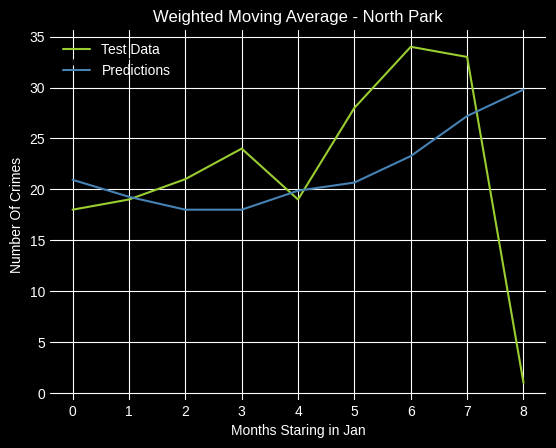

Neighborhood: Kensington-Bailey
Actuals: [32, 27, 30, 36, 40, 34, 34, 41]
Predictions: [37.266666666666666, 35.6, 32.53333333333333, 31.333333333333332, 32.4, 34.666666666666664, 35.0, 35.2]


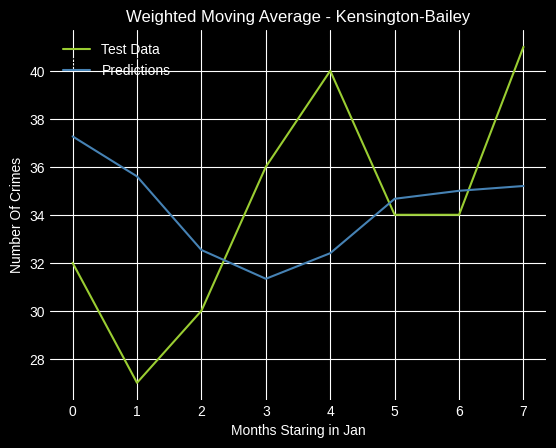

Neighborhood: Elmwood Bryant
Actuals: [41, 39, 52, 44, 45, 45, 42, 53]
Predictions: [46.8, 45.2, 43.13333333333333, 45.8, 45.333333333333336, 45.06666666666667, 45.333333333333336, 44.333333333333336]


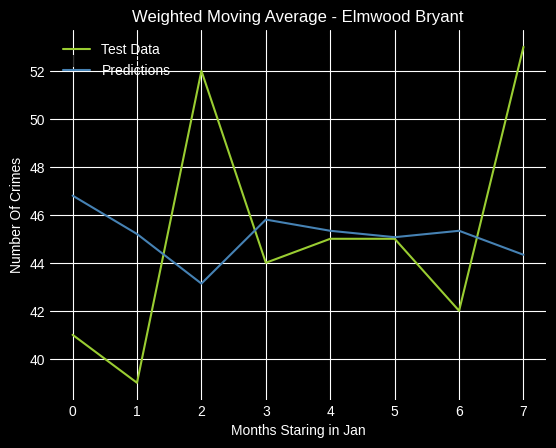

Neighborhood: Pratt-Willert
Actuals: [8, 10, 14, 13, 17, 20, 18, 29, 1]
Predictions: [15.466666666666667, 12.466666666666667, 10.733333333333333, 11.0, 11.2, 13.8, 16.333333333333332, 17.4, 21.6]


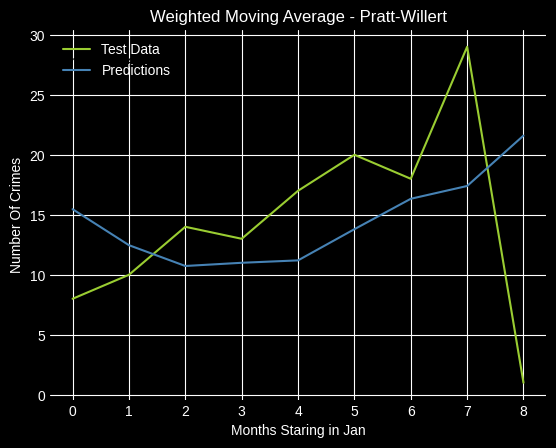

Neighborhood: Masten Park
Actuals: [33, 21, 20, 10, 19, 15, 14, 24]
Predictions: [17.933333333333334, 23.466666666666665, 23.466666666666665, 23.0, 18.866666666666667, 18.0, 16.133333333333333, 15.133333333333333]


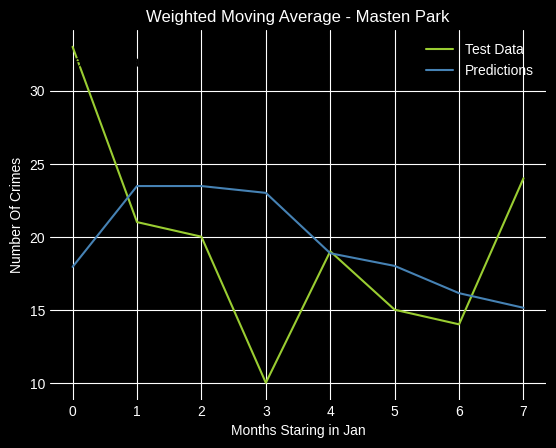

Neighborhood: West Hertel
Actuals: [39, 28, 26, 34, 39, 47, 50, 62, 1]
Predictions: [35.733333333333334, 35.46666666666667, 31.533333333333335, 28.2, 29.133333333333333, 33.6, 38.2, 43.266666666666666, 50.86666666666667]


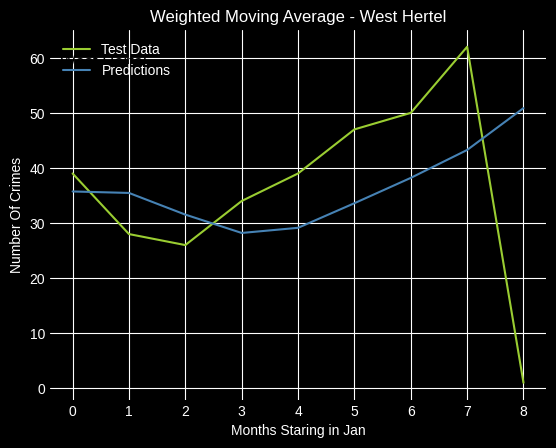

Neighborhood: University Heights
Actuals: [45, 46, 43, 41, 43, 60, 90, 58, 2]
Predictions: [45.0, 43.13333333333333, 41.46666666666667, 39.733333333333334, 40.46666666666667, 43.0, 48.46666666666667, 62.93333333333333, 63.8]


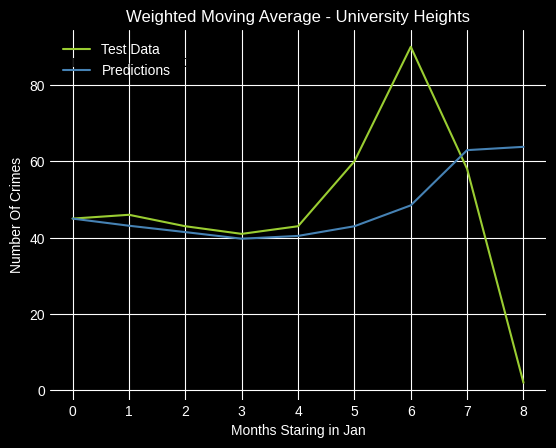

Neighborhood: Broadway Fillmore
Actuals: [56, 21, 27, 39, 53, 60, 51, 48, 1]
Predictions: [34.86666666666667, 39.333333333333336, 31.933333333333334, 29.133333333333333, 31.933333333333334, 40.0, 46.93333333333333, 50.6, 51.266666666666666]


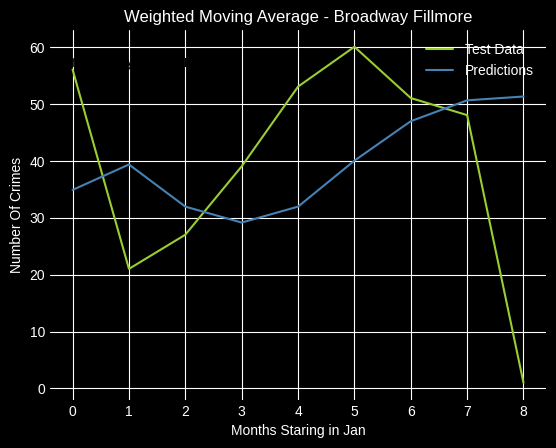

Neighborhood: Elmwood Bidwell
Actuals: [34, 22, 19, 24, 24, 30, 43, 43, 3]
Predictions: [26.666666666666668, 28.466666666666665, 25.6, 22.266666666666666, 22.2, 23.4, 25.2, 31.6, 36.6]


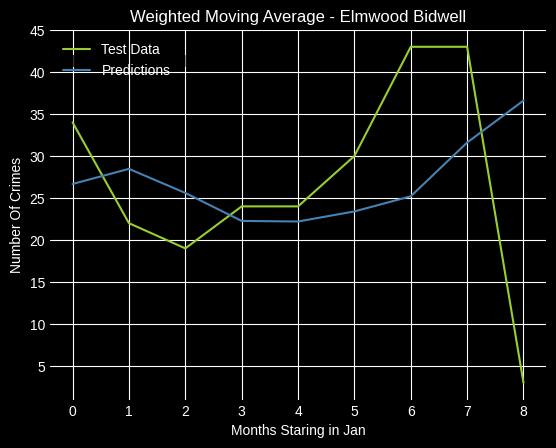

Neighborhood: Genesee-Moselle
Actuals: [32, 26, 29, 29, 34, 26, 33, 38]
Predictions: [33.13333333333333, 33.13333333333333, 30.933333333333334, 30.266666666666666, 29.4, 30.466666666666665, 29.133333333333333, 30.533333333333335]


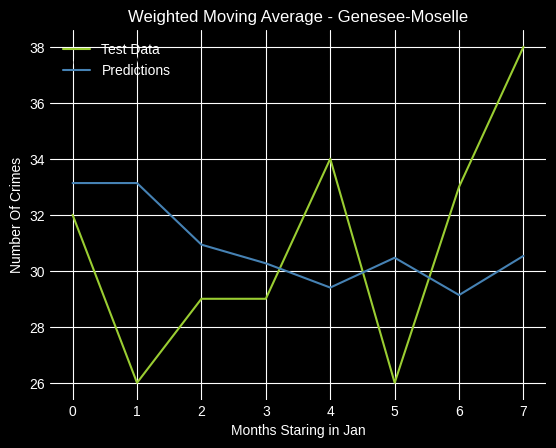

Neighborhood: Upper West Side
Actuals: [18, 7, 18, 14, 10, 19, 13, 27]
Predictions: [18.533333333333335, 19.0, 15.533333333333333, 15.933333333333334, 15.066666666666666, 12.8, 14.666666666666666, 14.466666666666667]


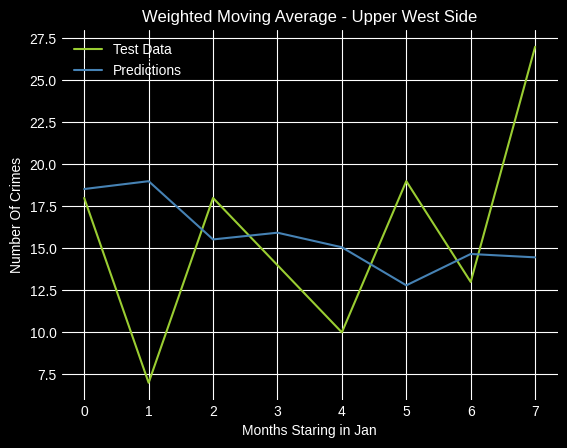

Neighborhood: West Side
Actuals: [36, 24, 40, 40, 52, 60, 51, 52, 5]
Predictions: [37.2, 34.53333333333333, 28.933333333333334, 31.066666666666666, 33.93333333333333, 41.6, 48.8, 51.4, 52.53333333333333]


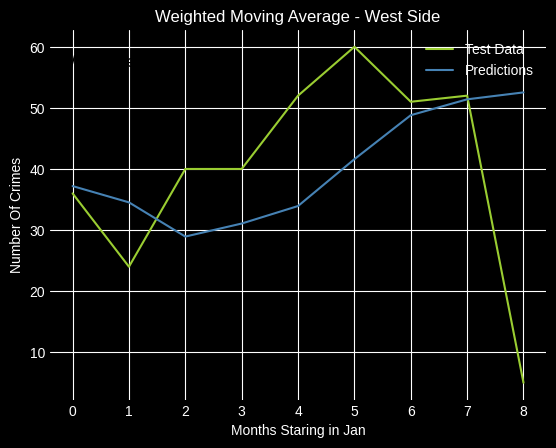

Neighborhood: Hamlin Park
Actuals: [30, 15, 11, 13, 30, 19, 20, 15, 1]
Predictions: [12.866666666666667, 17.2, 16.533333333333335, 14.8, 14.333333333333334, 19.666666666666668, 19.4, 20.2, 19.0]


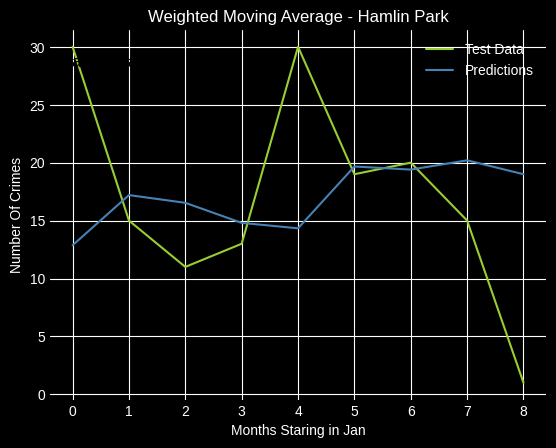

Neighborhood: Ellicott
Actuals: [27, 15, 17, 16, 21, 20, 35, 21, 1]
Predictions: [17.0, 19.466666666666665, 17.533333333333335, 16.6, 16.533333333333335, 18.466666666666665, 18.733333333333334, 24.466666666666665, 24.2]


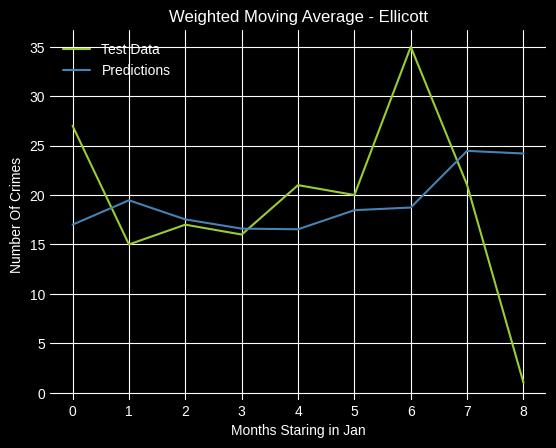

Neighborhood: Seneca Babcock
Actuals: [33, 19, 40, 34, 37, 40, 44, 30, 1]
Predictions: [24.933333333333334, 25.8, 22.266666666666666, 27.133333333333333, 30.266666666666666, 34.13333333333333, 36.6, 39.93333333333333, 36.93333333333333]


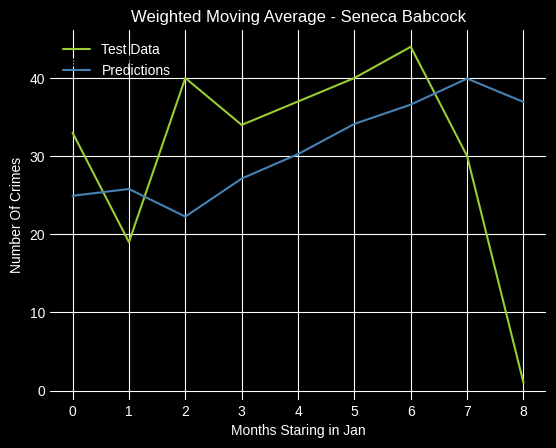

Neighborhood: Kenfield
Actuals: [13, 14, 16, 14, 20, 16, 17, 14]
Predictions: [16.0, 14.933333333333334, 14.266666666666667, 14.666666666666666, 14.4, 16.333333333333332, 16.533333333333335, 16.866666666666667]


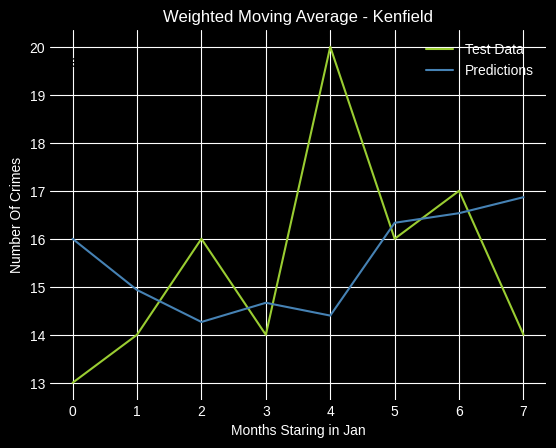

Neighborhood: nan
Actuals: [14, 18, 22, 25, 30, 22, 16, 11]
Predictions: [18.0, 15.733333333333333, 15.533333333333333, 17.466666666666665, 20.4, 24.4, 24.466666666666665, 22.0]


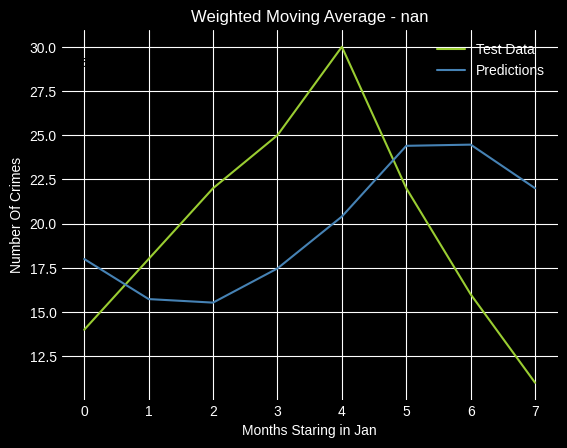

Neighborhood: First Ward
Actuals: [29, 26, 29, 39, 30, 36, 37, 26]
Predictions: [32.333333333333336, 30.8, 28.933333333333334, 28.333333333333332, 31.533333333333335, 31.6, 33.4, 35.06666666666667]


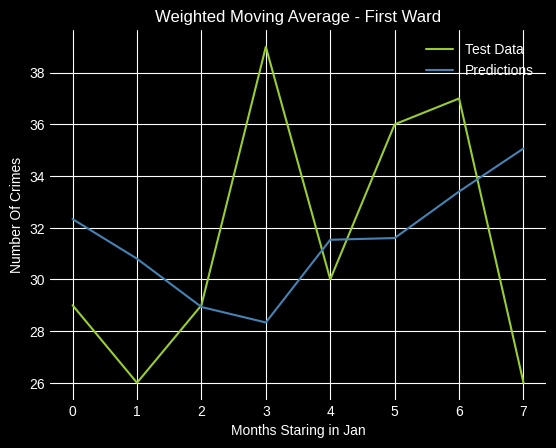

Neighborhood: Allentown
Actuals: [33, 27, 26, 37, 39, 30, 32, 41]
Predictions: [35.86666666666667, 34.93333333333333, 32.266666666666666, 30.066666666666666, 31.8, 33.86666666666667, 33.06666666666667, 33.13333333333333]


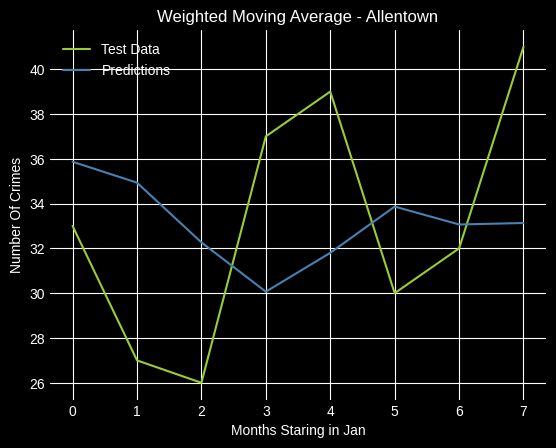

Neighborhood: Black Rock
Actuals: [12, 15, 14, 24, 21, 25, 23, 15]
Predictions: [20.533333333333335, 17.333333333333332, 15.933333333333334, 14.6, 17.333333333333332, 19.0, 21.6, 22.666666666666668]


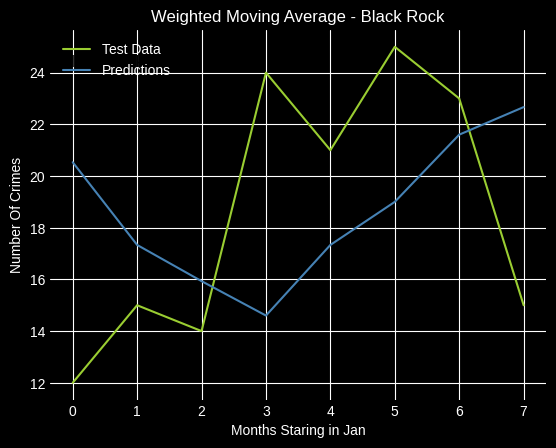

Neighborhood: Delavan Grider
Actuals: [16, 5, 13, 16, 24, 18, 18, 20]
Predictions: [19.333333333333332, 18.266666666666666, 13.533333333333333, 12.733333333333333, 13.266666666666667, 16.6, 17.666666666666668, 18.6]


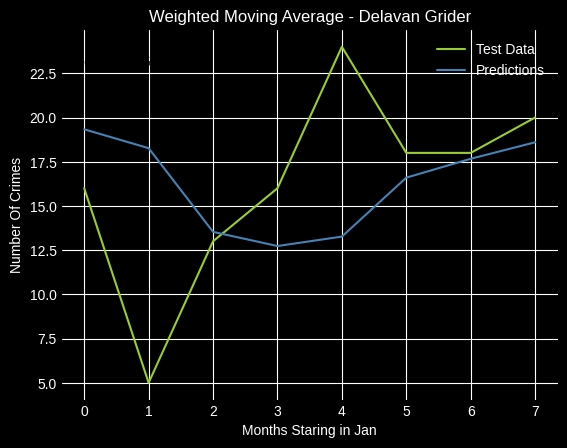

Neighborhood: Schiller Park
Actuals: [12, 12, 11, 20, 9, 13, 11, 14, 1]
Predictions: [8.6, 9.4, 10.0, 10.333333333333334, 13.666666666666666, 12.933333333333334, 13.0, 12.333333333333334, 12.733333333333333]


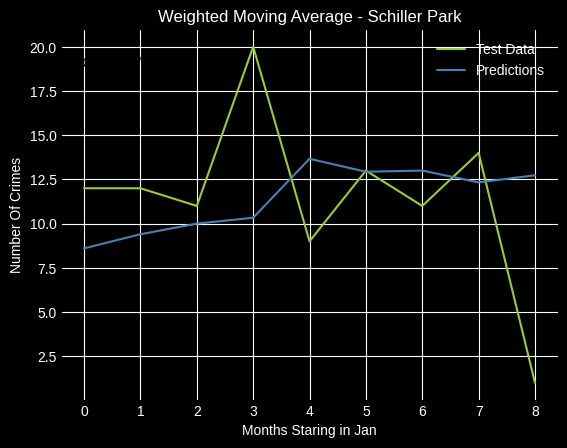

Neighborhood: Riverside
Actuals: [17, 12, 14, 6, 7, 15, 12, 7]
Predictions: [9.866666666666667, 12.4, 12.533333333333333, 13.0, 10.866666666666667, 9.466666666666667, 10.733333333333333, 11.133333333333333]


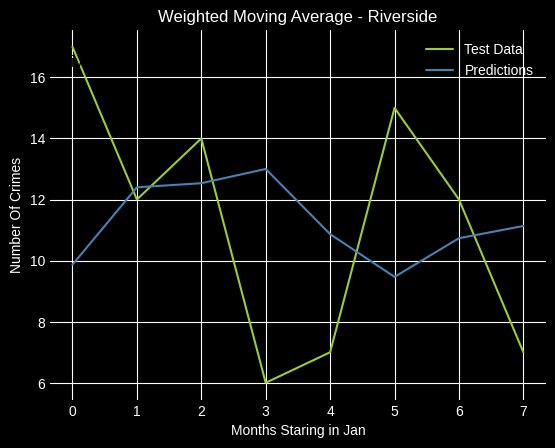

Neighborhood: Fruit Belt
Actuals: [12, 8, 4, 7, 13, 7, 8, 10]
Predictions: [9.066666666666666, 10.066666666666666, 9.4, 7.733333333333333, 7.266666666666667, 8.866666666666667, 8.266666666666667, 8.333333333333334]


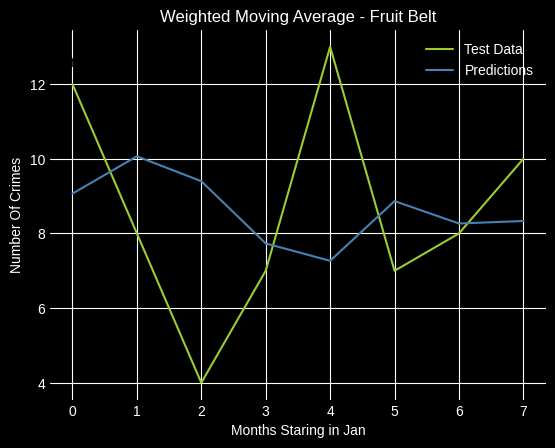

Neighborhood: Central Park
Actuals: [19, 16, 9, 17, 14, 18, 22, 17, 1]
Predictions: [12.6, 14.133333333333333, 14.333333333333334, 12.333333333333334, 13.866666666666667, 14.4, 15.4, 17.8, 18.133333333333333]


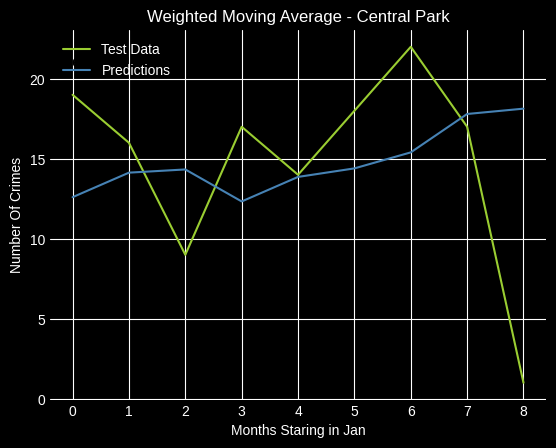

Neighborhood: MLK Park
Actuals: [10, 9, 7, 14, 14, 7, 4, 7]
Predictions: [7.6, 7.866666666666666, 8.066666666666666, 7.933333333333334, 10.133333333333333, 11.666666666666666, 10.4, 8.333333333333334]


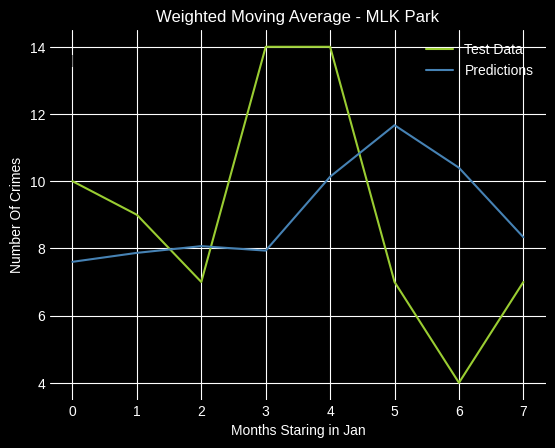

Neighborhood: Parkside
Actuals: [41, 17, 30, 32, 28, 24, 22, 27, 2]
Predictions: [17.333333333333332, 24.133333333333333, 22.066666666666666, 24.8, 27.666666666666668, 28.866666666666667, 27.0, 25.6, 25.533333333333335]


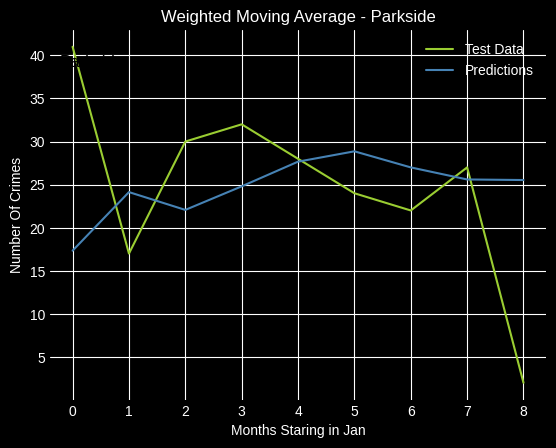

Neighborhood: Kaisertown
Actuals: [5, 2, 4, 2, 5, 5, 2, 4]
Predictions: [3.6666666666666665, 4.133333333333334, 3.4, 3.533333333333333, 3.066666666666667, 3.6, 4.066666666666666, 3.533333333333333]


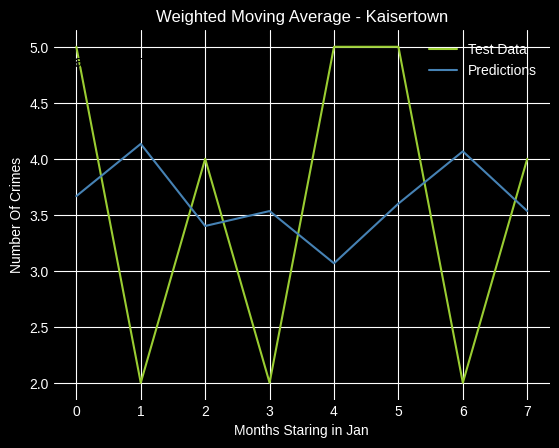

Neighborhood: Seneca-Cazenovia
Actuals: [25, 13, 20, 21, 22, 15, 22, 19, 1]
Predictions: [13.266666666666667, 16.333333333333332, 15.2, 16.533333333333335, 18.333333333333332, 20.333333333333332, 18.6, 19.866666666666667, 19.533333333333335]


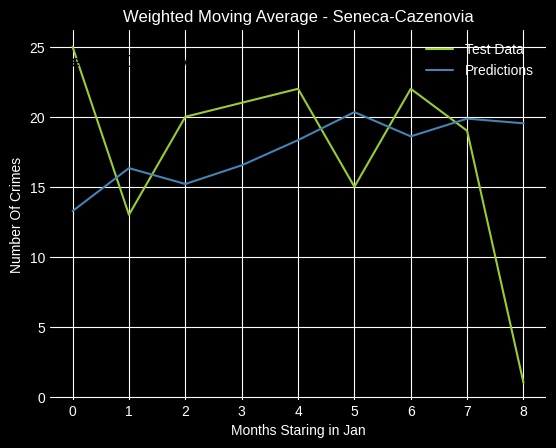

Neighborhood: Grant-Amherst
Actuals: [11, 9, 7, 8, 7, 8, 12, 6]
Predictions: [8.266666666666667, 9.2, 9.266666666666667, 8.533333333333333, 8.2, 7.8, 7.666666666666667, 9.066666666666666]


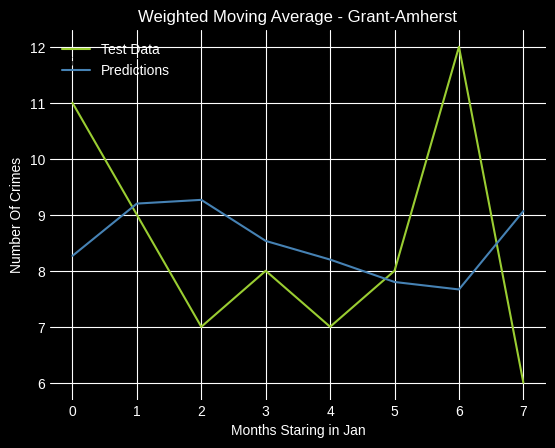

Test RMSE: 11.405


In [278]:
# Weighted Moving Average
window = 5
predTot = list()
testTot = list()

# get unique neighborhood names
unique_neighborhoods = data_test['neighborhood_1'].unique()

# walk forward over time steps in test
#for neighNum in range(len(train_d)):
for neighNum, neighborhood in enumerate(unique_neighborhoods):

    history = train_d[neighNum]
    test = test_d[neighNum]

    # Check if there is test data for this neighborhood
    if len(test) == 0:
        continue  # Skip neighborhoods with no test data

    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = np.average([history[i] for i in range(length - window, length)], weights=[1,2,3,4,5])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)

    #print('Neighborhood: {}'.format(neighNum+1))
    print('Neighborhood: {}'.format(neighborhood))
    print('Actuals: {}'.format(test))
    print('Predictions: {}'.format(preds))

    # plot
    plt.plot(test, color='yellowgreen')
    plt.plot(preds, color='steelblue')

    # Add neighborhood name as annotation
    plt.annotate(neighborhood, (0.02, 0.9), xycoords='axes fraction', fontsize=12, color='black')

    plt.title(f'Weighted Moving Average - {neighborhood}')
    plt.xlabel('Months Staring in Jan')
    plt.ylabel('Number Of Crimes')
    plt.legend(['Test Data', 'Predictions'])


    plt.show()

    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

# Crime Projection On The Last Eight Months Using Exponential Moving Average


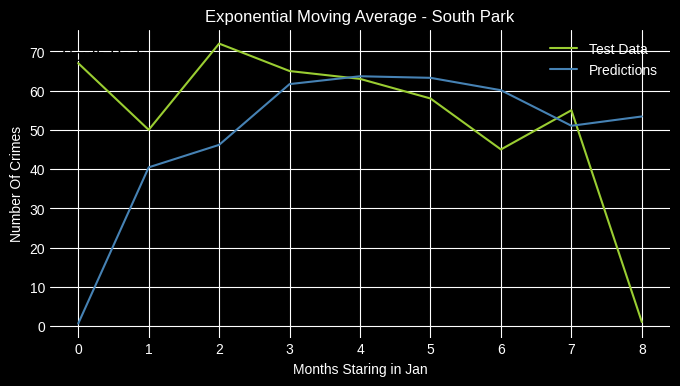

Neighborhood: South Park
Actuals: [67, 50, 72, 65, 63, 58, 45, 55, 1]
Predictions: [0.6, 40.44, 46.176, 61.6704, 63.66816, 63.267264, 60.1069056, 51.04276224, 53.417104896]


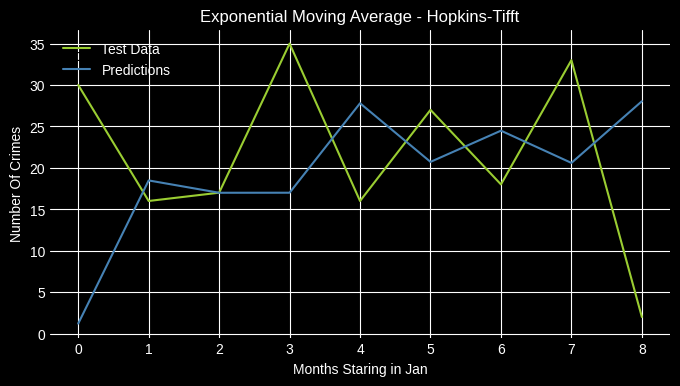

Neighborhood: Hopkins-Tifft
Actuals: [30, 16, 17, 35, 16, 27, 18, 33, 2]
Predictions: [1.2, 18.48, 16.992, 16.9968, 27.79872, 20.719488, 24.4877952, 20.59511808, 28.038047232]


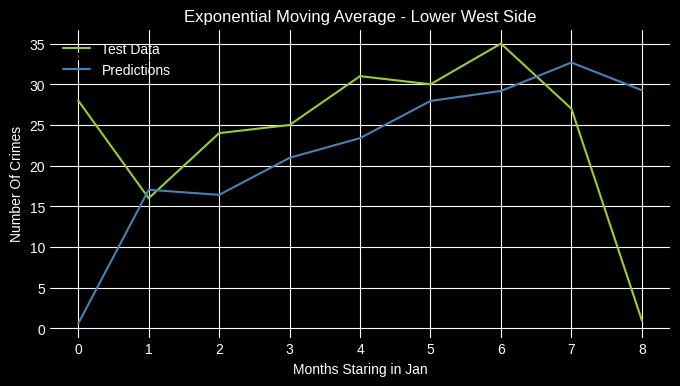

Neighborhood: Lower West Side
Actuals: [28, 16, 24, 25, 31, 30, 35, 27, 1]
Predictions: [0.6, 17.04, 16.416, 20.9664, 23.386560000000003, 27.954624, 29.1818496, 32.67273984, 29.269095936]


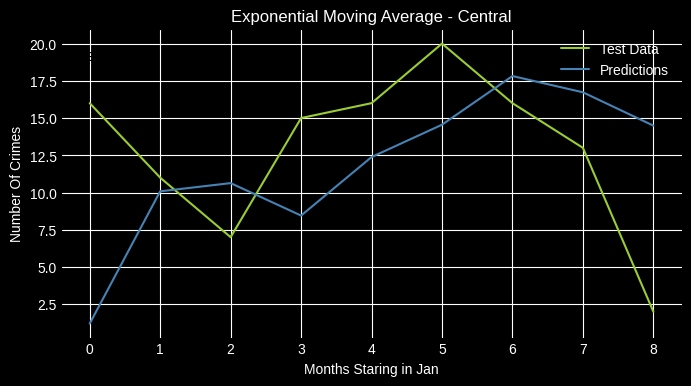

Neighborhood: Central
Actuals: [16, 11, 7, 15, 16, 20, 16, 13, 2]
Predictions: [1.2, 10.08, 10.632, 8.4528, 12.38112, 14.552448, 17.8209792, 16.72839168, 14.491356672000002]


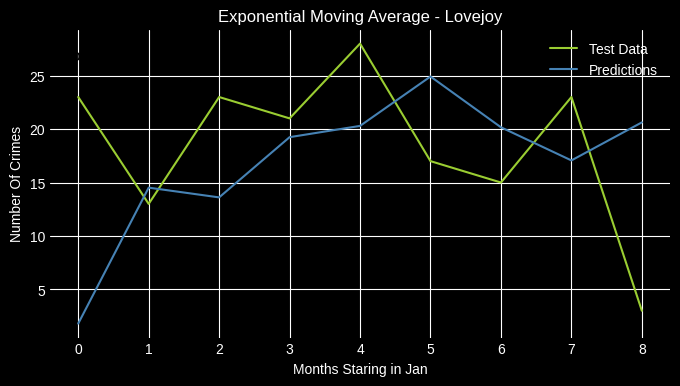

Neighborhood: Lovejoy
Actuals: [23, 13, 23, 21, 28, 17, 15, 23, 3]
Predictions: [1.7999999999999998, 14.52, 13.608, 19.2432, 20.29728, 24.918912, 20.1675648, 17.06702592, 20.626810368]


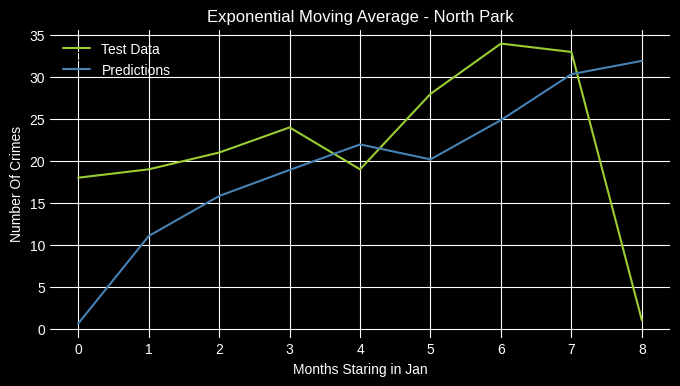

Neighborhood: North Park
Actuals: [18, 19, 21, 24, 19, 28, 34, 33, 1]
Predictions: [0.6, 11.04, 15.815999999999999, 18.9264, 21.97056, 20.188223999999998, 24.875289600000002, 30.35011584, 31.940046336]


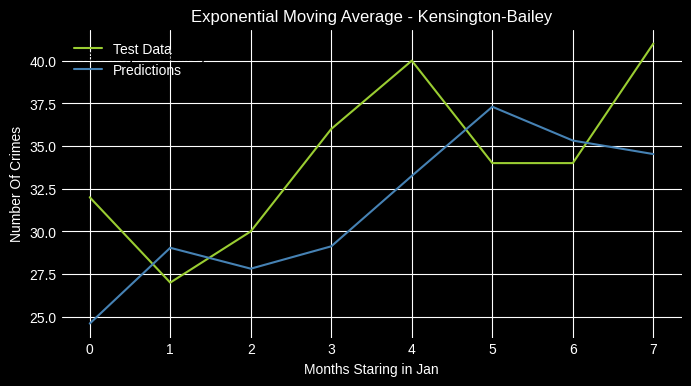

Neighborhood: Kensington-Bailey
Actuals: [32, 27, 30, 36, 40, 34, 34, 41]
Predictions: [24.599999999999998, 29.04, 27.816, 29.1264, 33.25056, 37.300224, 35.3200896, 34.52803584]


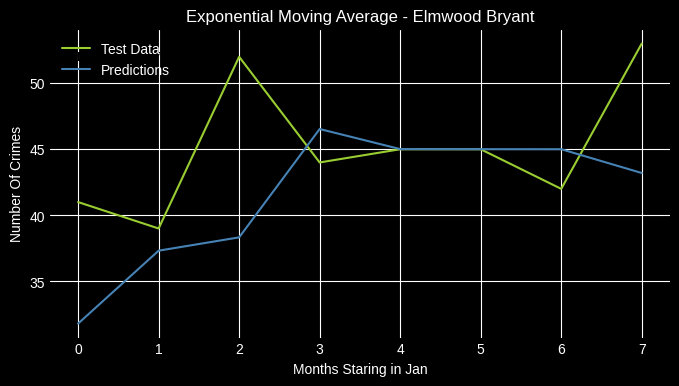

Neighborhood: Elmwood Bryant
Actuals: [41, 39, 52, 44, 45, 45, 42, 53]
Predictions: [31.799999999999997, 37.31999999999999, 38.327999999999996, 46.5312, 45.01248, 45.004992, 45.0019968, 43.20079872]


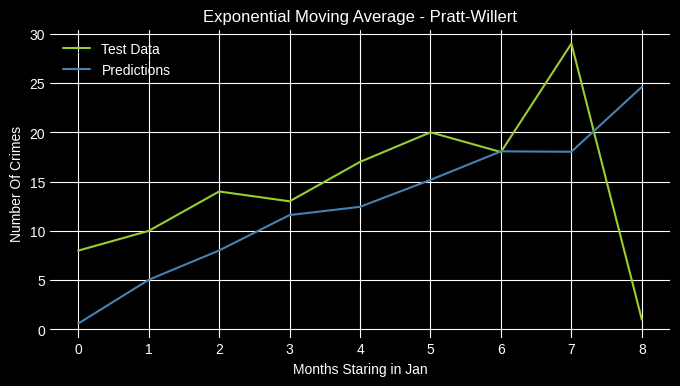

Neighborhood: Pratt-Willert
Actuals: [8, 10, 14, 13, 17, 20, 18, 29, 1]
Predictions: [0.6, 5.04, 8.016, 11.6064, 12.44256, 15.177024, 18.0708096, 18.02832384, 24.611329536]


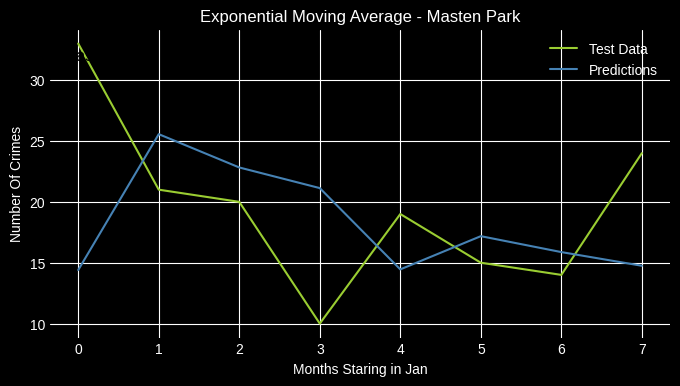

Neighborhood: Masten Park
Actuals: [33, 21, 20, 10, 19, 15, 14, 24]
Predictions: [14.399999999999999, 25.560000000000002, 22.824, 21.129600000000003, 14.451840000000002, 17.180736000000003, 15.872294400000001, 14.748917760000001]


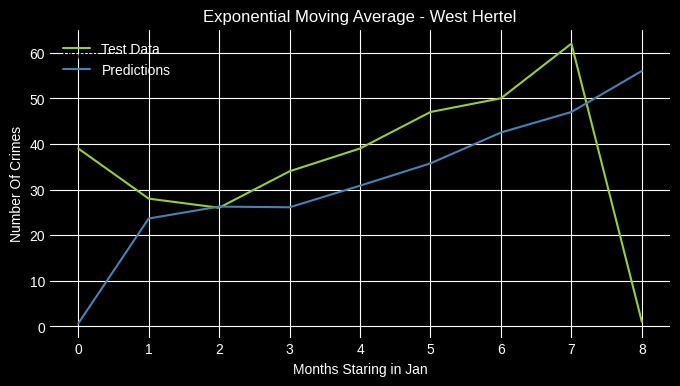

Neighborhood: West Hertel
Actuals: [39, 28, 26, 34, 39, 47, 50, 62, 1]
Predictions: [0.6, 23.639999999999997, 26.256, 26.102400000000003, 30.840960000000003, 35.736384, 42.4945536, 46.99782144, 55.999128576]


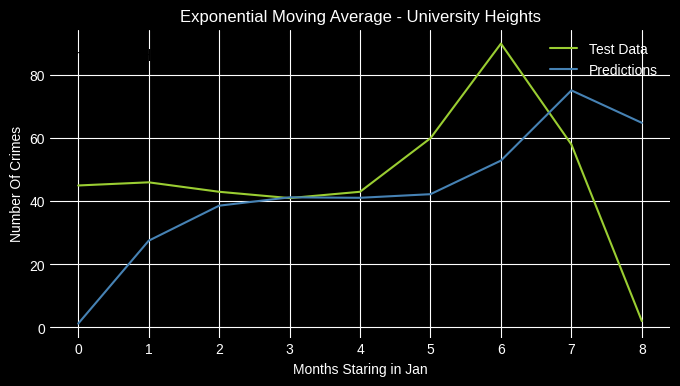

Neighborhood: University Heights
Actuals: [45, 46, 43, 41, 43, 60, 90, 58, 2]
Predictions: [1.2, 27.48, 38.592, 41.2368, 41.094719999999995, 42.237888, 52.895155200000005, 75.15806208000001, 64.863224832]


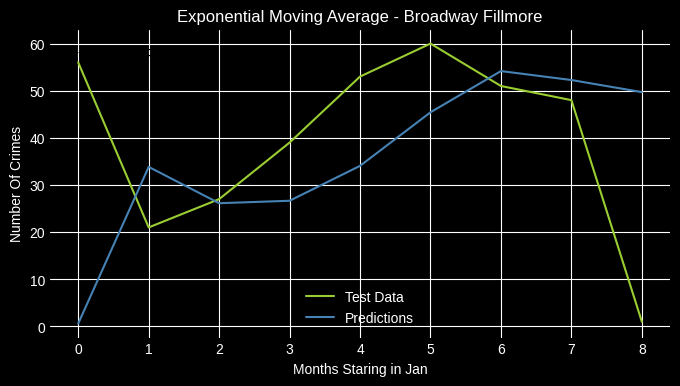

Neighborhood: Broadway Fillmore
Actuals: [56, 21, 27, 39, 53, 60, 51, 48, 1]
Predictions: [0.6, 33.84, 26.136000000000003, 26.654400000000003, 34.06176, 45.424704, 54.1698816, 52.26795264, 49.707181055999996]


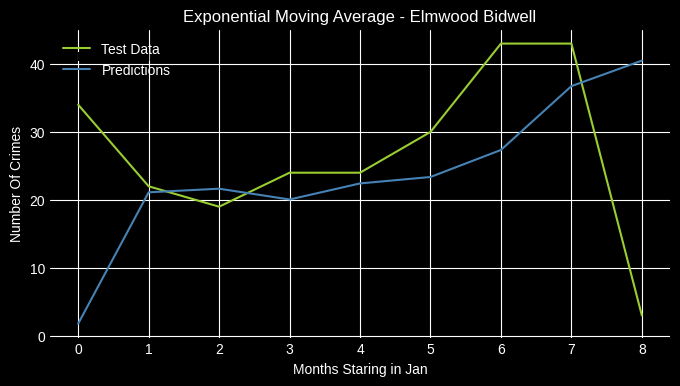

Neighborhood: Elmwood Bidwell
Actuals: [34, 22, 19, 24, 24, 30, 43, 43, 3]
Predictions: [1.7999999999999998, 21.119999999999997, 21.647999999999996, 20.059199999999997, 22.423679999999997, 23.369472, 27.3477888, 36.73911552, 40.495646208]


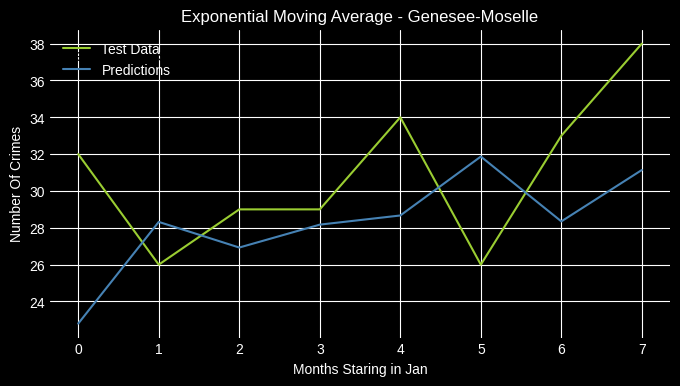

Neighborhood: Genesee-Moselle
Actuals: [32, 26, 29, 29, 34, 26, 33, 38]
Predictions: [22.8, 28.32, 26.928, 28.1712, 28.66848, 31.867392, 28.3469568, 31.138782720000002]


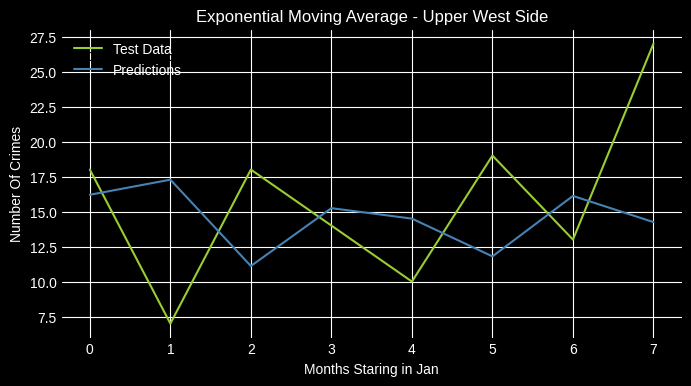

Neighborhood: Upper West Side
Actuals: [18, 7, 18, 14, 10, 19, 13, 27]
Predictions: [16.2, 17.28, 11.112000000000002, 15.2448, 14.49792, 11.799168000000002, 16.119667200000002, 14.24786688]


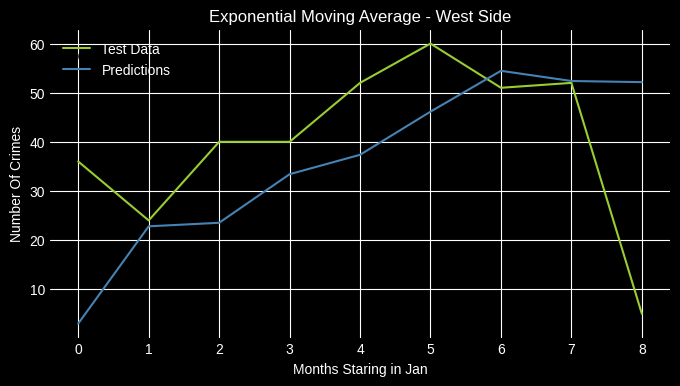

Neighborhood: West Side
Actuals: [36, 24, 40, 40, 52, 60, 51, 52, 5]
Predictions: [3.0, 22.799999999999997, 23.519999999999996, 33.408, 37.3632, 46.14528, 54.458112, 52.3832448, 52.15329792]


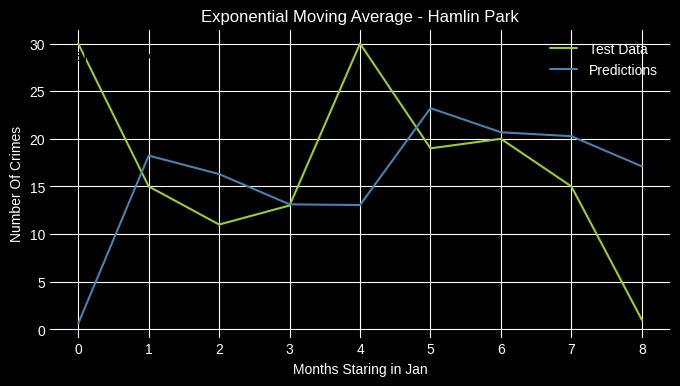

Neighborhood: Hamlin Park
Actuals: [30, 15, 11, 13, 30, 19, 20, 15, 1]
Predictions: [0.6, 18.24, 16.296, 13.1184, 13.047360000000001, 23.218944, 20.6875776, 20.275031040000002, 17.110012416000004]


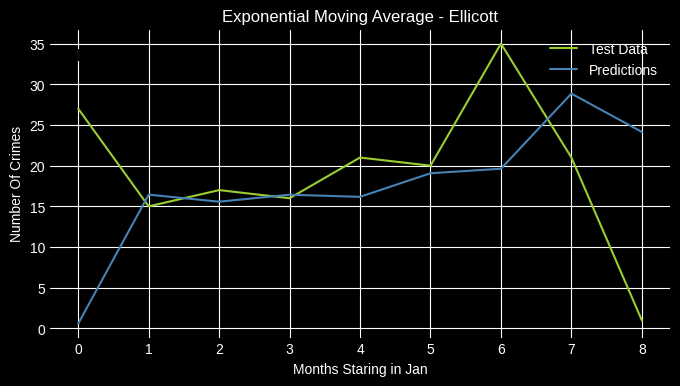

Neighborhood: Ellicott
Actuals: [27, 15, 17, 16, 21, 20, 35, 21, 1]
Predictions: [0.6, 16.439999999999998, 15.576, 16.4304, 16.172159999999998, 19.068863999999998, 19.627545599999998, 28.85101824, 24.140407296]


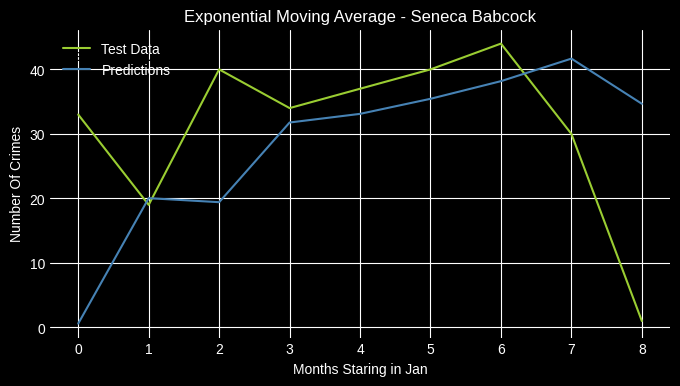

Neighborhood: Seneca Babcock
Actuals: [33, 19, 40, 34, 37, 40, 44, 30, 1]
Predictions: [0.6, 20.04, 19.416, 31.7664, 33.10656, 35.442624, 38.177049600000004, 41.67081984, 34.668327936]


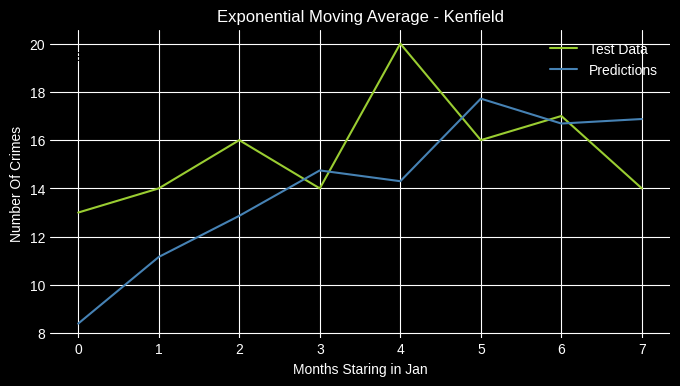

Neighborhood: Kenfield
Actuals: [13, 14, 16, 14, 20, 16, 17, 14]
Predictions: [8.4, 11.16, 12.864, 14.7456, 14.29824, 17.719296, 16.6877184, 16.875087360000002]


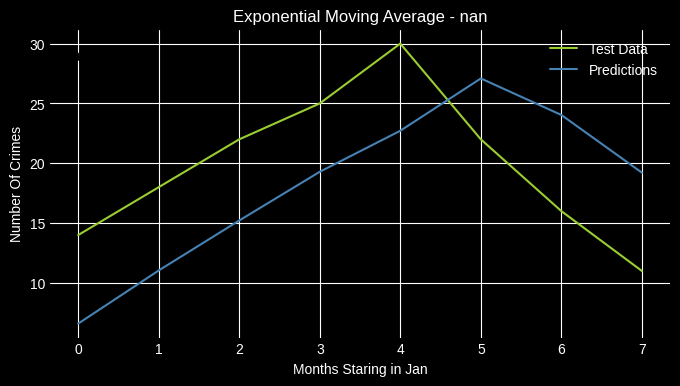

Neighborhood: nan
Actuals: [14, 18, 22, 25, 30, 22, 16, 11]
Predictions: [6.6, 11.040000000000001, 15.216, 19.2864, 22.71456, 27.085824000000002, 24.0343296, 19.21373184]


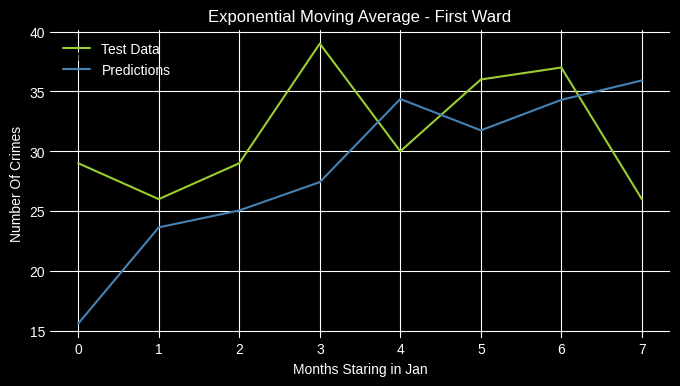

Neighborhood: First Ward
Actuals: [29, 26, 29, 39, 30, 36, 37, 26]
Predictions: [15.6, 23.64, 25.056, 27.4224, 34.36896, 31.747584000000003, 34.2990336, 35.91961344]


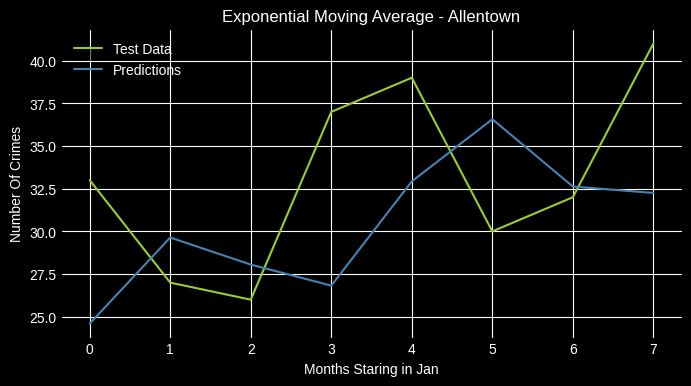

Neighborhood: Allentown
Actuals: [33, 27, 26, 37, 39, 30, 32, 41]
Predictions: [24.599999999999998, 29.64, 28.056, 26.822400000000002, 32.928960000000004, 36.571584, 32.6286336, 32.25145344]


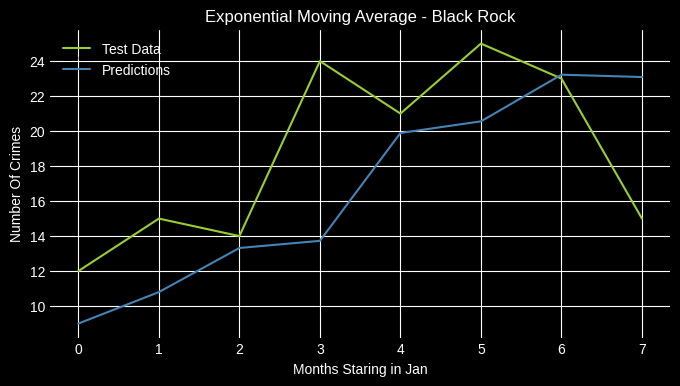

Neighborhood: Black Rock
Actuals: [12, 15, 14, 24, 21, 25, 23, 15]
Predictions: [9.0, 10.799999999999999, 13.32, 13.728000000000002, 19.891199999999998, 20.55648, 23.222592, 23.0890368]


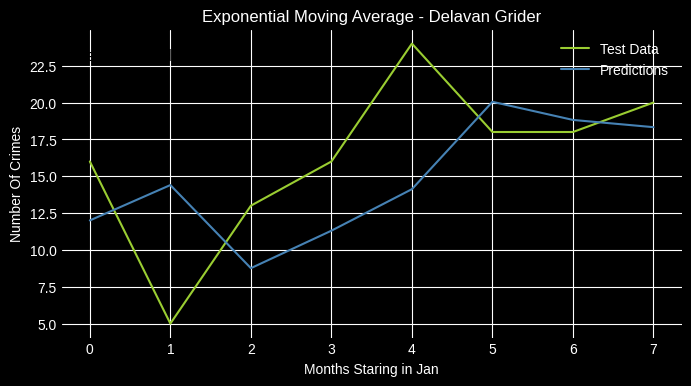

Neighborhood: Delavan Grider
Actuals: [16, 5, 13, 16, 24, 18, 18, 20]
Predictions: [12.0, 14.4, 8.760000000000002, 11.304, 14.1216, 20.04864, 18.819456, 18.327782399999997]


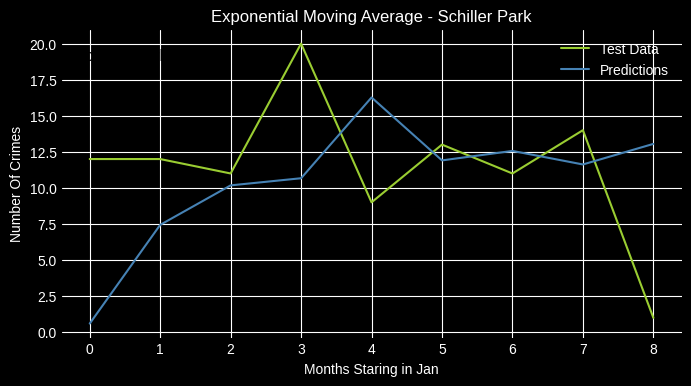

Neighborhood: Schiller Park
Actuals: [12, 12, 11, 20, 9, 13, 11, 14, 1]
Predictions: [0.6, 7.4399999999999995, 10.175999999999998, 10.670399999999999, 16.26816, 11.907264000000001, 12.5629056, 11.62516224, 13.050064896]


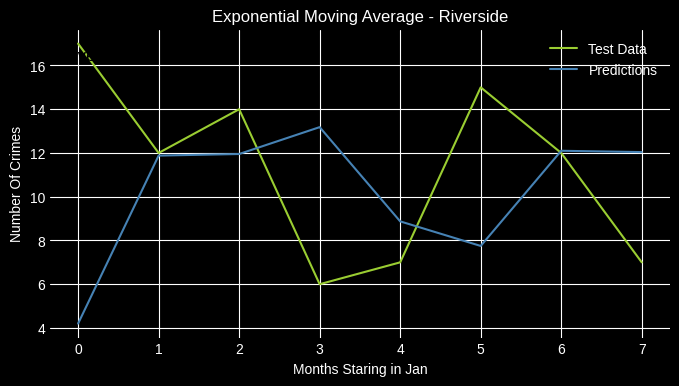

Neighborhood: Riverside
Actuals: [17, 12, 14, 6, 7, 15, 12, 7]
Predictions: [4.2, 11.879999999999999, 11.951999999999998, 13.1808, 8.87232, 7.748928, 12.0995712, 12.03982848]


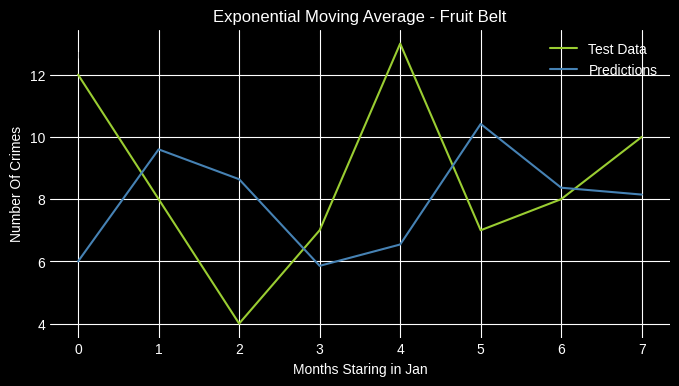

Neighborhood: Fruit Belt
Actuals: [12, 8, 4, 7, 13, 7, 8, 10]
Predictions: [6.0, 9.6, 8.64, 5.856, 6.542400000000001, 10.41696, 8.366783999999999, 8.1467136]


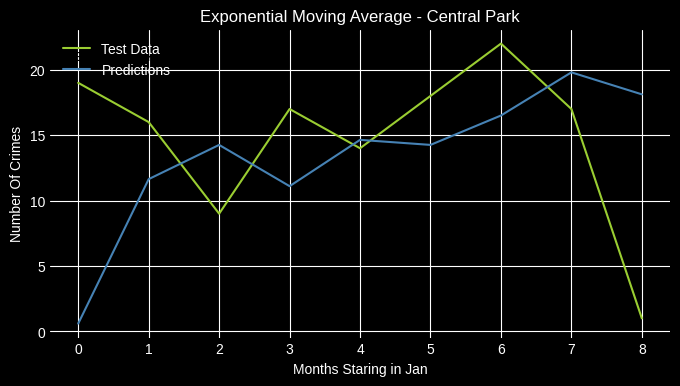

Neighborhood: Central Park
Actuals: [19, 16, 9, 17, 14, 18, 22, 17, 1]
Predictions: [0.6, 11.64, 14.256, 11.1024, 14.64096, 14.256384, 16.5025536, 19.80102144, 18.120408576]


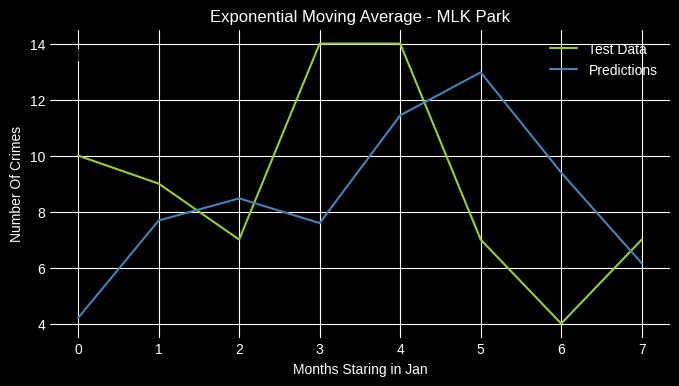

Neighborhood: MLK Park
Actuals: [10, 9, 7, 14, 14, 7, 4, 7]
Predictions: [4.2, 7.68, 8.472, 7.5888, 11.43552, 12.974208, 9.3896832, 6.15587328]


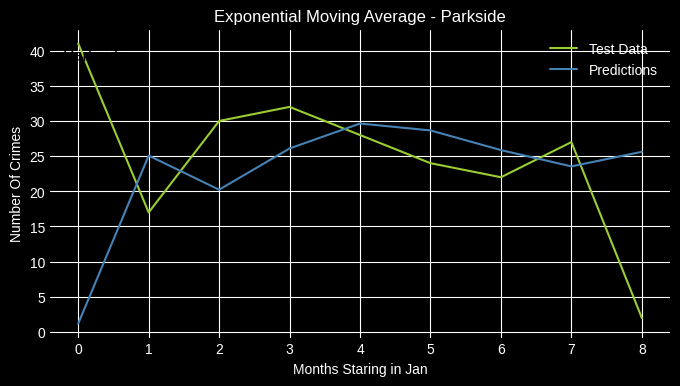

Neighborhood: Parkside
Actuals: [41, 17, 30, 32, 28, 24, 22, 27, 2]
Predictions: [1.2, 25.08, 20.232, 26.0928, 29.63712, 28.654848, 25.861939200000002, 23.54477568, 25.617910272]


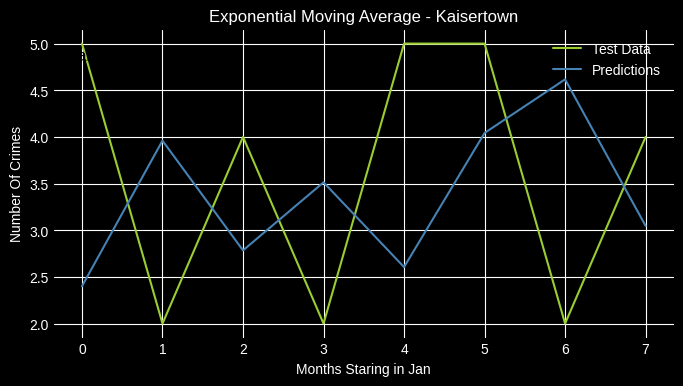

Neighborhood: Kaisertown
Actuals: [5, 2, 4, 2, 5, 5, 2, 4]
Predictions: [2.4, 3.96, 2.784, 3.5136, 2.6054399999999998, 4.0421759999999995, 4.6168704, 3.04674816]


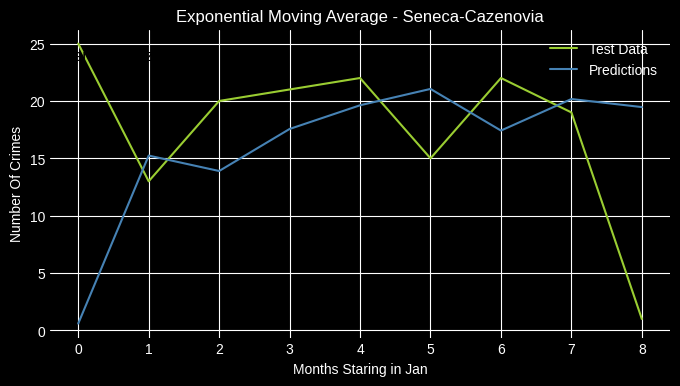

Neighborhood: Seneca-Cazenovia
Actuals: [25, 13, 20, 21, 22, 15, 22, 19, 1]
Predictions: [0.6, 15.24, 13.896, 17.5584, 19.623359999999998, 21.049343999999998, 17.419737599999998, 20.167895039999998, 19.467158016]


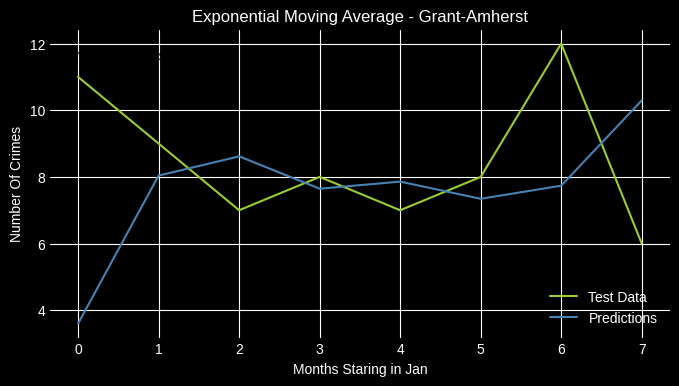

Neighborhood: Grant-Amherst
Actuals: [11, 9, 7, 8, 7, 8, 12, 6]
Predictions: [3.5999999999999996, 8.04, 8.616, 7.6464, 7.85856, 7.343424000000001, 7.7373696, 10.294947839999999]
Test RMSE: 13.853


In [279]:
# Exponential Moving Average
predTot = list()
testTot = list()
alpha = 0.6

# Get unique neighborhood names
unique_neighborhoods = data_test['neighborhood_1'].unique()

# Walk forward over time steps in test
for neighNum, neighborhood in enumerate(unique_neighborhoods):

    history = train_d[neighNum]
    test = test_d[neighNum]

    # Check if there is test data for this neighborhood
    if len(test) == 0:
        continue  # Skip neighborhoods with no test data

    preds = []
    lastPred = 0
    for t in range(len(test)):
        yhat = ((1-alpha)*lastPred + (alpha*history[-1]))
        lastPred = yhat
        obs = test[t]
        preds.append(yhat)
        history.append(obs)

    # Plot
    plt.figure(figsize=(8, 4))  # Adjust figure size
    plt.plot(test, color='yellowgreen')
    plt.plot(preds, color='steelblue')

    # Add neighborhood name as annotation
    plt.annotate(neighborhood, (0.02, 0.9), xycoords='axes fraction', fontsize=12, color='black')

    plt.title(f'Exponential Moving Average - {neighborhood}')
    plt.xlabel('Months Staring in Jan')
    plt.ylabel('Number Of Crimes')
    plt.legend(['Test Data', 'Predictions'])
    plt.show()

        #print('Neighborhood: {}'.format(neighNum+1))
    print('Neighborhood: {}'.format(neighborhood))
    print('Actuals: {}'.format(test))
    print('Predictions: {}'.format(preds))

    testTot = testTot + test
    predTot = predTot + preds

error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)


# Conclusion
<a id='conclusion'></a>

In conclusion, the graphs and charts presented throughout the project have been instrumental in conveying critical insights:

- We observed a remarkable annual decline in the total number of crimes since 2009.

- The year 2022 accounted for a relatively modest 3.95% of the total crimes recorded in the dataset spanning from 2009 to the present day.

- While Fridays appeared to exhibit a slightly higher incidence of crimes when compared to other days, the difference was not markedly significant.

- February consistently registered the lowest number of crimes per month, as evident from the graphical representations.

- The annual crime rate displayed a declining trend, characterized by a distinctive zigzag pattern, with crime receding during colder seasons and resurging during hotter months.

- The specific week within a month appeared to have minimal impact on crime rates, with the observation that the fifth week recorded fewer incidents, attributed to its shorter duration.

- Our hypothesis regarding the decrease in crime during the blizzard was disproven; it was solely attributable to the typical February weather and its influence on crime due to the freezing conditions.

- The predominant type of crime across Buffalo neighborhoods was larceny or theft, with the noteworthy exception of the Delavan Grider neighborhood, where assault was the dominant category.

In terms of forecasting accuracy, we obtained Root Mean Square Errors (RMSE) for crime predictions per neighborhood:

- Simple Moving Average: RMSE of 11.41
- Weighted Moving Average: RMSE of 11.405
- Exponential Moving Average: RMSE of 13.85